# TODO

## Task 2
dla robota o danym id wygenerowac kolejne zachowanie z planu (moze okazac sie ze kolejny fragment zachowania jest niemozliwy do przypisania)

## Task 4 
wysyłanie blokujacych robotow na wolne parkingi

## Task 6 
Weryfikacja przydzielanych zadan. Czy w trakcie przydzielania zadan program nie zawisnie na petli? Czy zawsze dojdzie do wywolania break. 

## Task 7 
Dokumentacja klas z grafami jakie typy danych wchodzą i wychodzą z funkcji

## Task 8
Ustalić jak integrować dispatchera i graf z supervisorem

## Task 9 
weryfikowac czy dla krawedzi goto robot ma dojechac z zadana orientacja czy nie. Wynika z typu wezla do ktorego ma dojechac robot. Dla krawedzi, ktorych kombinacja uklada sie nastepujaco:
- (waiting, waiting-departure), a koniec (dock, wait)
nalezy pilnowac orientacji.

## Task 12 
wysylanie robotow bedacych w trakcie wykonywania zadania, a nie mogacych dojechac do POI

#w pierwszej kolejnosci wykorzystywane jest statyczne przeszukiwanie grafu bez uwzględniania mogących pojawić się w trakcie pracy korków. tzn. wygenerowany jest plan do wykonania przez roboty i kolejne akcje które mają wykonać. 
#w kolejnym etapie dołożenie algorytmu, który będzie uwzględniał pojawiające się korki i zablokowania tras

In [1]:
import copy
import graph_creator as gc
import dispatcher as disp
import simulator as sim

In [2]:
PRIORITY = {
    "HIGH": 4,
    "NORMAL": 3,
    "LOW": 2
}

In [3]:
poi_list = {
    1: {"type": gc.base_node_type["queue"]}, #"name": "Q", "pos": (-5,7)
    2: {"type": gc.base_node_type["parking"]}, #"name": "P", "pos": (3,7)
    3: {"type": gc.base_node_type["unload"]}, #"name": "POI3", "pos": (11,7)
    4: {"type": gc.base_node_type["charger"]}, #"name": "C", "pos": (12,0)
    5: {"type": gc.base_node_type["unload-dock"]}, #"name": "POI4", "pos": (12,7)
    6: {"type": gc.base_node_type["load"]}, #"name": "POI1", "pos": (-3,-8)
    7: {"type": gc.base_node_type["load-dock"]} #"name": "POI2", "pos": (-6,0)
}

node_list = {
    1: {"name": "Q1", "pos": (-5,7), "type": gc.base_node_type["queue"], "poiId": 1},
    2: {"name": "N1", "pos": (-3,7), "type": gc.base_node_type["normal"], "poiId": 0},
    3: {"name": "I1", "pos": (-5,5), "type": gc.base_node_type["intersection"], "poiId": 0},
    4: {"name": "I2", "pos": (-3,5), "type": gc.base_node_type["intersection"], "poiId": 0},
    5: {"name": "I3", "pos": (3,5), "type": gc.base_node_type["intersection"], "poiId": 0},
    6: {"name": "P1", "pos": (3,7), "type": gc.base_node_type["parking"], "poiId": 2},
    7: {"name": "I4", "pos": (8,5), "type": gc.base_node_type["intersection"], "poiId": 0},
    8: {"name": "WD1", "pos": (11,5), "type": gc.base_node_type["waiting-departure"], "poiId": 0},
    9: {"name": "POI3", "pos": (11,7), "type": gc.base_node_type["unload"], "poiId": 3},
    10: {"name": "I5", "pos": (8,2), "type": gc.base_node_type["intersection"], "poiId": 0},
    11: {"name": "D1", "pos": (12,2), "type": gc.base_node_type["departure"], "poiId": 0},
    12: {"name": "C1", "pos": (12,0), "type": gc.base_node_type["charger"], "poiId": 4},
    13: {"name": "W1", "pos": (12,-2), "type": gc.base_node_type["waiting"], "poiId": 0},
    14: {"name": "I6", "pos": (8,-2), "type": gc.base_node_type["intersection"], "poiId": 0},
    15: {"name": "I7", "pos": (8,-5), "type": gc.base_node_type["intersection"], "poiId": 0},
    16: {"name": "WD2", "pos": (8,-7), "type": gc.base_node_type["waiting-departure"], "poiId": 0},
    17: {"name": "POI4", "pos": (12,-7), "type": gc.base_node_type["unload-dock"], "poiId": 5},
    18: {"name": "I8", "pos": (0,-5), "type": gc.base_node_type["intersection"], "poiId": 0},
    19: {"name": "D2", "pos": (0,-8), "type": gc.base_node_type["departure"], "poiId": 0},
    20: {"name": "POI1", "pos": (-3,-8), "type": gc.base_node_type["load"], "poiId": 6},
    21: {"name": "W2", "pos": (-5,-8), "type": gc.base_node_type["waiting"], "poiId": 0},
    22: {"name": "I9", "pos": (-5,-5), "type": gc.base_node_type["intersection"], "poiId": 0},
    23: {"name": "N2", "pos": (-7,-5), "type": gc.base_node_type["normal"], "poiId": 0},
    24: {"name": "I10", "pos": (-7,-2), "type": gc.base_node_type["intersection"], "poiId": 0},
    25: {"name": "W3", "pos": (-5,-2), "type": gc.base_node_type["waiting"], "poiId": 0},
    26: {"name": "POI2", "pos": (-5,0), "type": gc.base_node_type["load-dock"], "poiId": 7},
    27: {"name": "D3", "pos": (-5,2), "type": gc.base_node_type["departure"], "poiId": 0},
    28: {"name": "I11", "pos": (-7,2), "type": gc.base_node_type["intersection"], "poiId": 0},
    29: {"name": "N3", "pos": (-7,5), "type": gc.base_node_type["normal"], "poiId": 0},
}

edge_list = {
    #Krawędzie dojazdu do miejsca oczekiwania na dojazd do stanowiska
    1: {"startNode": 2, "endNode": 1, "type": gc.way_type["oneWay"], "isActive": True},
    2: {"startNode": 4, "endNode": 2, "type": gc.way_type["oneWay"], "isActive": True},
    3: {"startNode": 1, "endNode": 3, "type": gc.way_type["oneWay"], "isActive": True},
    4: {"startNode": 3, "endNode": 4, "type": gc.way_type["twoWay"], "isActive": True},
    5: {"startNode": 4, "endNode": 5, "type": gc.way_type["twoWay"], "isActive": True},
    6: {"startNode": 5, "endNode": 6, "type": gc.way_type["narrowTwoWay"], "isActive": True},
    7: {"startNode": 5, "endNode": 7, "type": gc.way_type["twoWay"], "isActive": True},
    8: {"startNode": 7, "endNode": 8, "type": gc.way_type["twoWay"], "isActive": True},
    9: {"startNode": 8, "endNode": 9, "type": gc.way_type["narrowTwoWay"], "isActive": True},
    10: {"startNode": 7, "endNode": 10, "type": gc.way_type["twoWay"], "isActive": True},
    11: {"startNode": 11, "endNode": 10, "type": gc.way_type["oneWay"], "isActive": True},
    12: {"startNode": 12, "endNode": 11, "type": gc.way_type["oneWay"], "isActive": True},
    13: {"startNode": 13, "endNode": 12, "type": gc.way_type["oneWay"], "isActive": True},
    14: {"startNode": 14, "endNode": 13, "type": gc.way_type["oneWay"], "isActive": True},
    15: {"startNode": 10, "endNode": 14, "type": gc.way_type["twoWay"], "isActive": True},
    16: {"startNode": 14, "endNode": 15, "type": gc.way_type["twoWay"], "isActive": True},
    17: {"startNode": 15, "endNode": 16, "type": gc.way_type["twoWay"], "isActive": True},
    18: {"startNode": 16, "endNode": 17, "type": gc.way_type["narrowTwoWay"], "isActive": True},
    19: {"startNode": 15, "endNode": 18, "type": gc.way_type["twoWay"], "isActive": True},
    20: {"startNode": 19, "endNode": 18, "type": gc.way_type["oneWay"], "isActive": True},
    21: {"startNode": 20, "endNode": 19, "type": gc.way_type["oneWay"], "isActive": True},
    22: {"startNode": 21, "endNode": 20, "type": gc.way_type["oneWay"], "isActive": True},
    23: {"startNode": 22, "endNode": 21, "type": gc.way_type["oneWay"], "isActive": True},
    24: {"startNode": 22, "endNode": 18, "type": gc.way_type["twoWay"], "isActive": True},
    25: {"startNode": 22, "endNode": 23, "type": gc.way_type["twoWay"], "isActive": True},
    26: {"startNode": 23, "endNode": 24, "type": gc.way_type["twoWay"], "isActive": True},
    27: {"startNode": 24, "endNode": 25, "type": gc.way_type["oneWay"], "isActive": True},
    28: {"startNode": 25, "endNode": 26, "type": gc.way_type["oneWay"], "isActive": True},
    29: {"startNode": 26, "endNode": 27, "type": gc.way_type["oneWay"], "isActive": True},
    30: {"startNode": 27, "endNode": 28, "type": gc.way_type["oneWay"], "isActive": True},
    31: {"startNode": 24, "endNode": 28, "type": gc.way_type["twoWay"], "isActive": True},
    32: {"startNode": 28, "endNode": 29, "type": gc.way_type["twoWay"], "isActive": True},
    33: {"startNode": 29, "endNode": 3, "type": gc.way_type["twoWay"], "isActive": True},
}

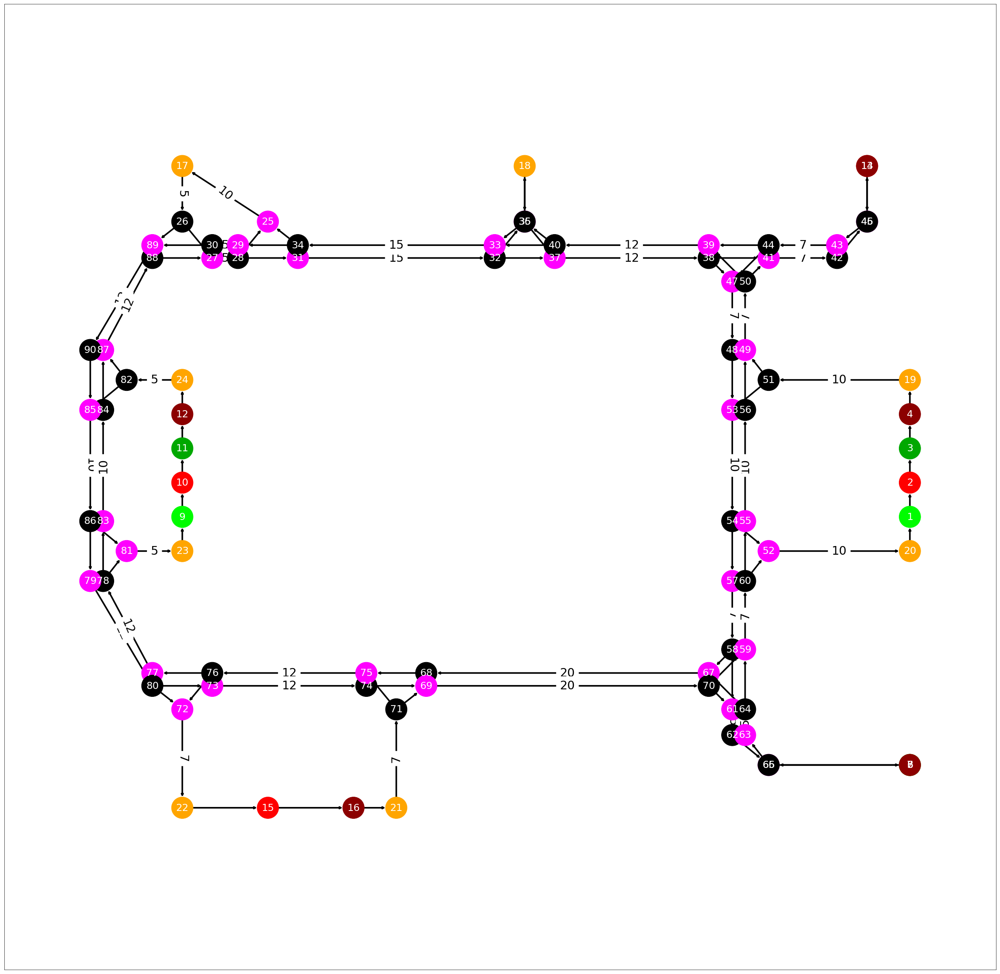

In [4]:
graf = gc.SupervisorGraphCreator(node_list, edge_list)
graf.print_graph()

In [123]:
robots = [
    {"id": 1, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 2, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 3, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0}
] 

tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 4, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 0,
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['HIGH']
       },
        {"id": 2,
        "behaviours": [{"id": 1, "parameters": {"to": 6, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]}}],
        "current_behaviour_index": -1,
        "robot": 0,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['HIGH']
       },
]
robots_sim = sim.Robots(robots,5)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

In [155]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow 
supervisor_sim.run(robots_state_list) 
#supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (3, 4)          25         20      True   True  
2         2      (15, 16)        85         10      True   True  
3         None   (25, 17)        155        0       True   False 

---------------------------Stan zadan---------------------------
taskId  robotId   WEIGHT              start_time          status    curr_beh_id    behaviours

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (3, 4)          30         20      True   True  
2         2      (15, 16)        90         10      True   True  
3         None   (25, 17)        160        0       True   False 


#  Test 1 
### 1 robot wykonuje zadanie - dojazdy do wszystkich mozliwych typow POI

In [21]:
#ladowarka
#przypisanie nowego zadania dojazdu do ladowarki i kolejne akcje dojazdu do tego poi
robots = [
    {"id": 1, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0}
] 

tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 4, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 1,
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['HIGH']
       },
]

robots_sim = sim.Robots(robots,5)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (3, 4)          20         20      True   True  


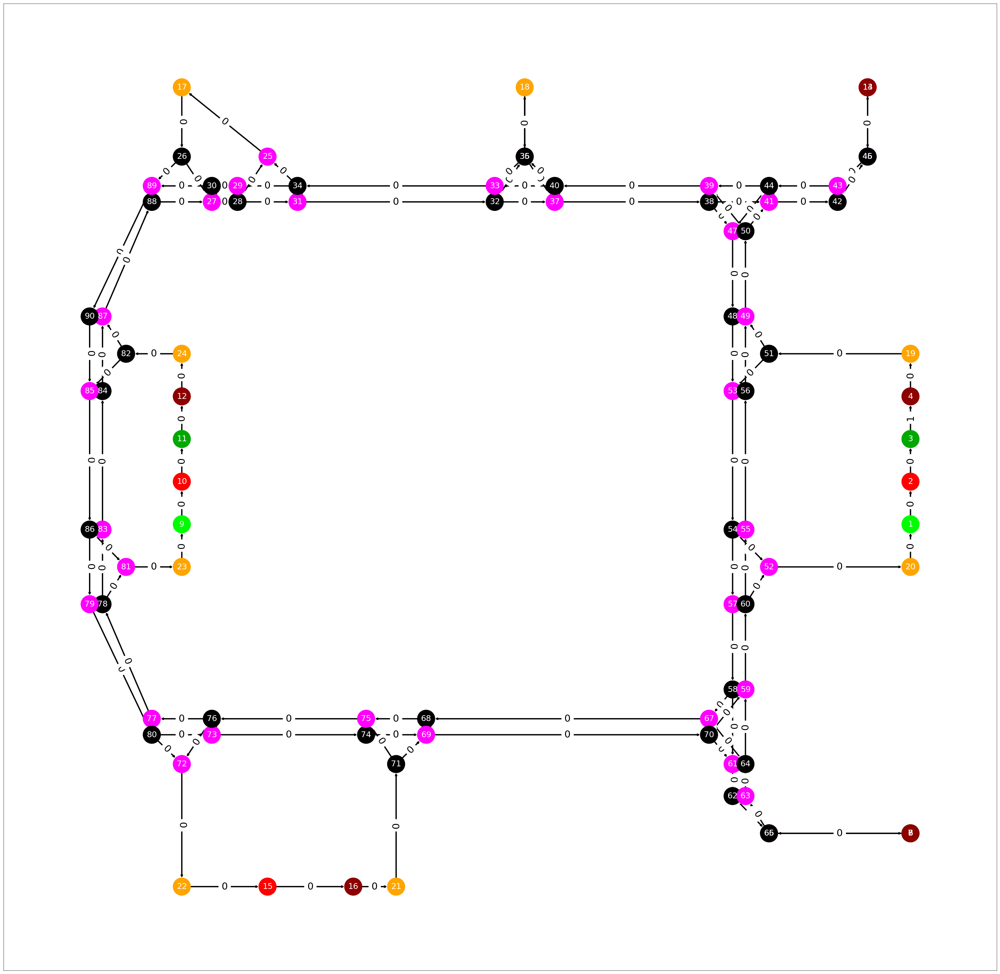


---------------------------Stan zadan---------------------------
taskId  robotId   WEIGHT              start_time          status    curr_beh_id    behaviours

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (3, 4)          25         20      True   True  


In [52]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

In [55]:
#przypisanie nowego zadania dojazdu do POI3 (POI bez dokowania, wezel waiting-departure)
robots = [
    {"id": 1, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0}
] 

tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 3, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 1,
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['HIGH']
       },
]
robots_sim = sim.Robots(robots,5)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (13, 14)        15         10      True   True  


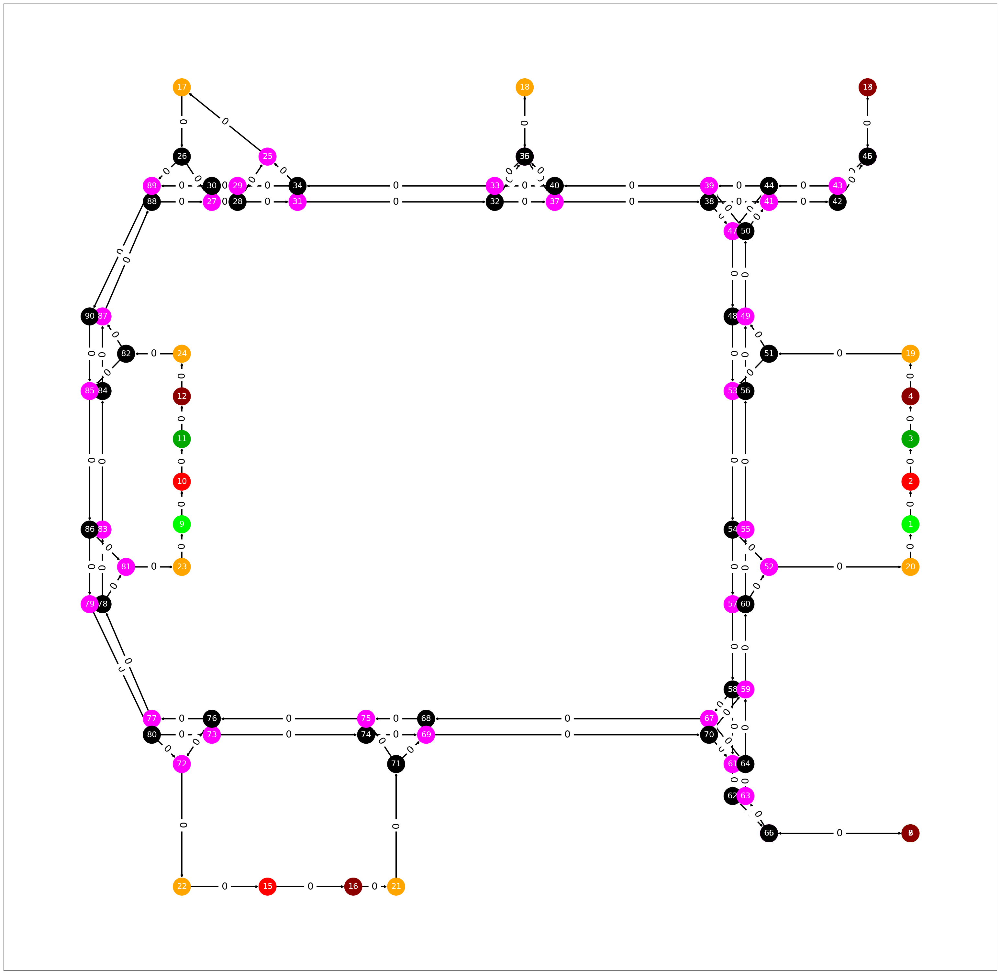


---------------------------Stan zadan---------------------------
taskId  robotId   WEIGHT              start_time          status    curr_beh_id    behaviours

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (13, 14)        20         10      True   True  


In [74]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

In [100]:
#przypisanie nowego zadania dojazdu do POI5 (POI z dokowaniem, wezel waiting-departure)
robots = [
    {"id": 1, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0}
] 

tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 5, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                        {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 1,
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['HIGH']
       },
]
robots_sim = sim.Robots(robots,5)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (7, 8)          25         20      True   True  


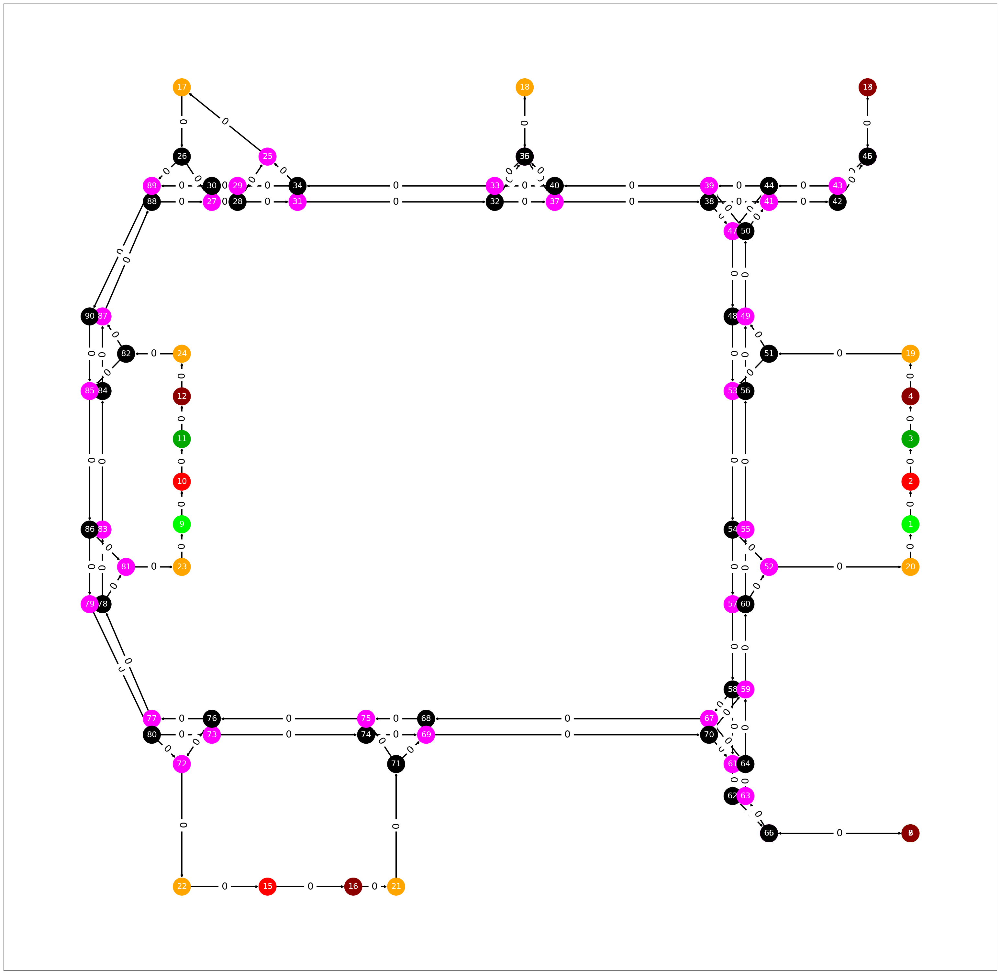


---------------------------Stan zadan---------------------------
taskId  robotId   WEIGHT              start_time          status    curr_beh_id    behaviours

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (7, 8)          30         20      True   True  


In [136]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

In [138]:
#przypisanie nowego zadania dojazdu do POI2 (parking)
robots = [
    {"id": 1, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0}
] 

tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 2, "name": disp.Behaviour.TYPES["goto"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 1,
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['HIGH']
       },
]
robots_sim = sim.Robots(robots,2)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (35, 18)        4          4       True   True  


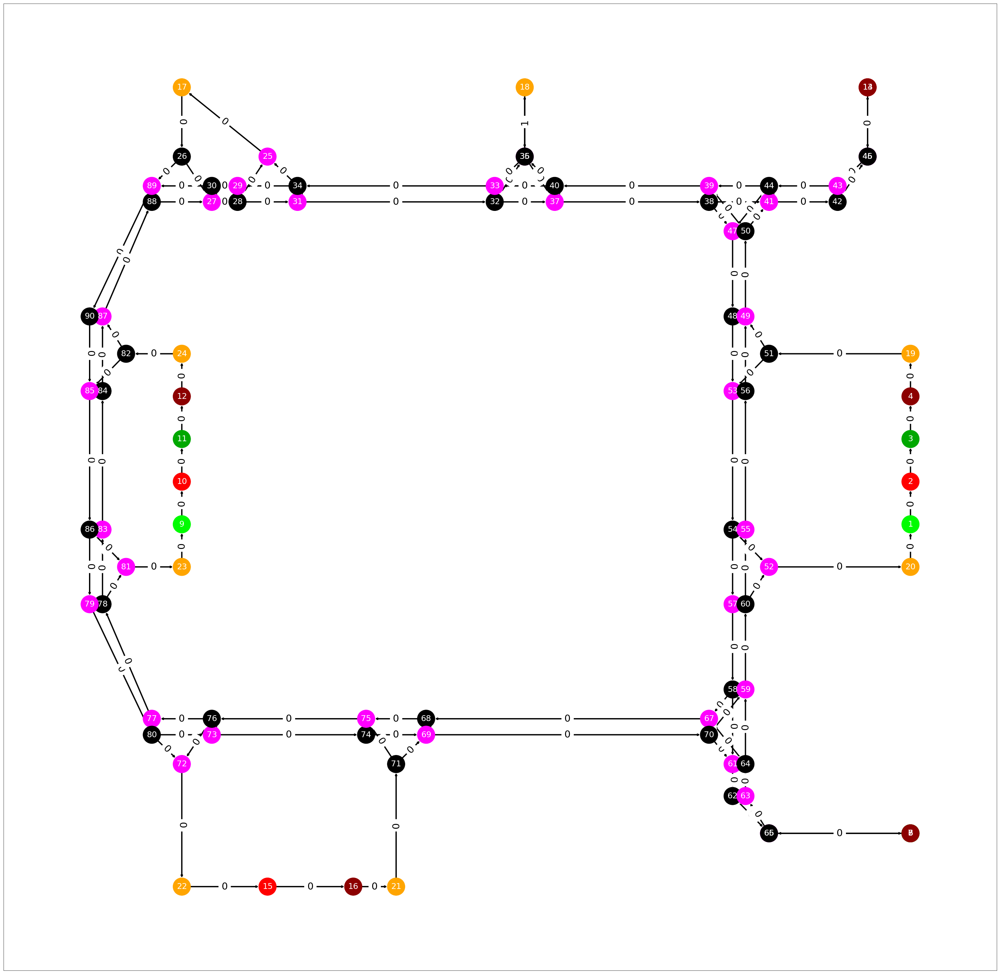


---------------------------Stan zadan---------------------------
taskId  robotId   WEIGHT              start_time          status    curr_beh_id    behaviours

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (35, 18)        6          4       True   True  


In [157]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

In [158]:
#przypisanie nowego zadania dojazdu do POI1 (kolejkowanie)
robots = [
    {"id": 1, "edge": (4,19), "planningOn": True, "isFree": True, "timeRemaining": 0}
] 

tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 1, "name": disp.Behaviour.TYPES["goto"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 1,
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['HIGH']
       },
]
robots_sim = sim.Robots(robots,5)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (25, 17)        15         8       True   True  


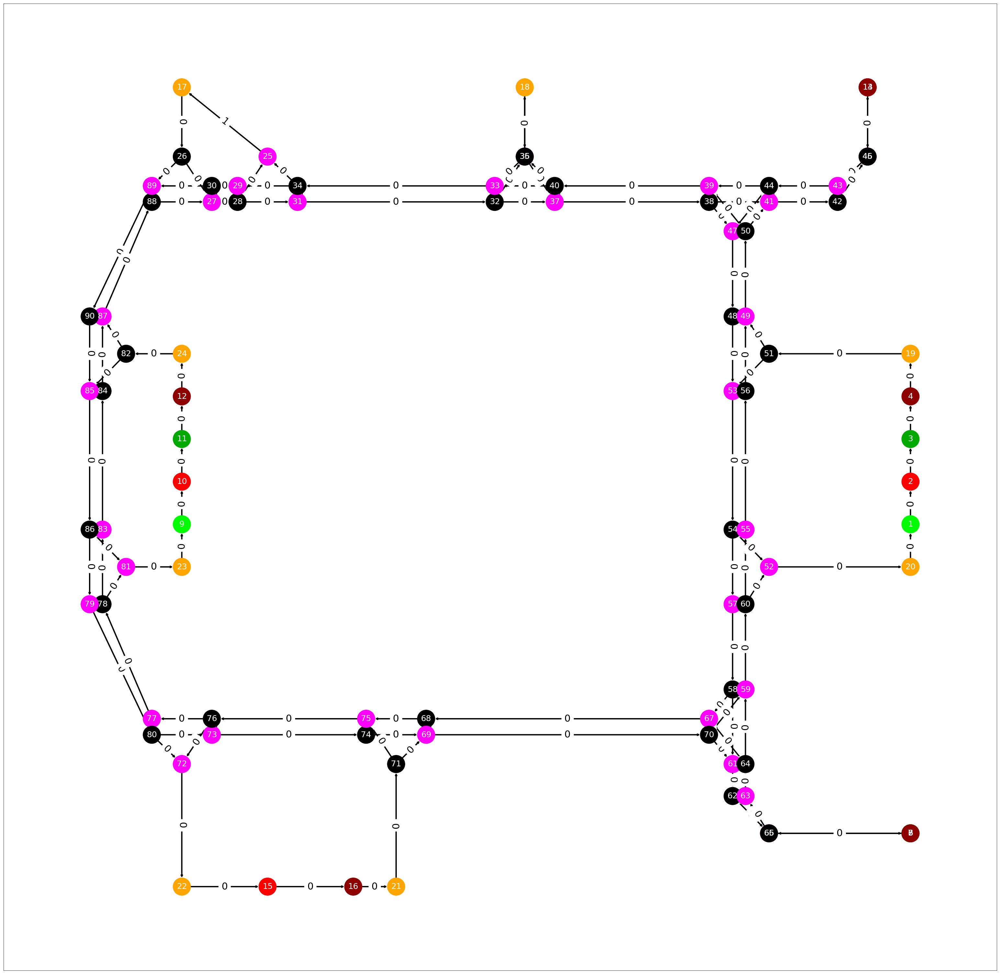


---------------------------Stan zadan---------------------------
taskId  robotId   WEIGHT              start_time          status    curr_beh_id    behaviours

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (25, 17)        20         8       True   True  


In [175]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

In [212]:
#przypisanie nowego zadania dojazdu do POI6 (bez dokowania)
robots = [
    {"id": 1, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0}
] 

tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 6, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 1,
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['HIGH']
       },
]
robots_sim = sim.Robots(robots,5)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (15, 16)        10         10      True   True  


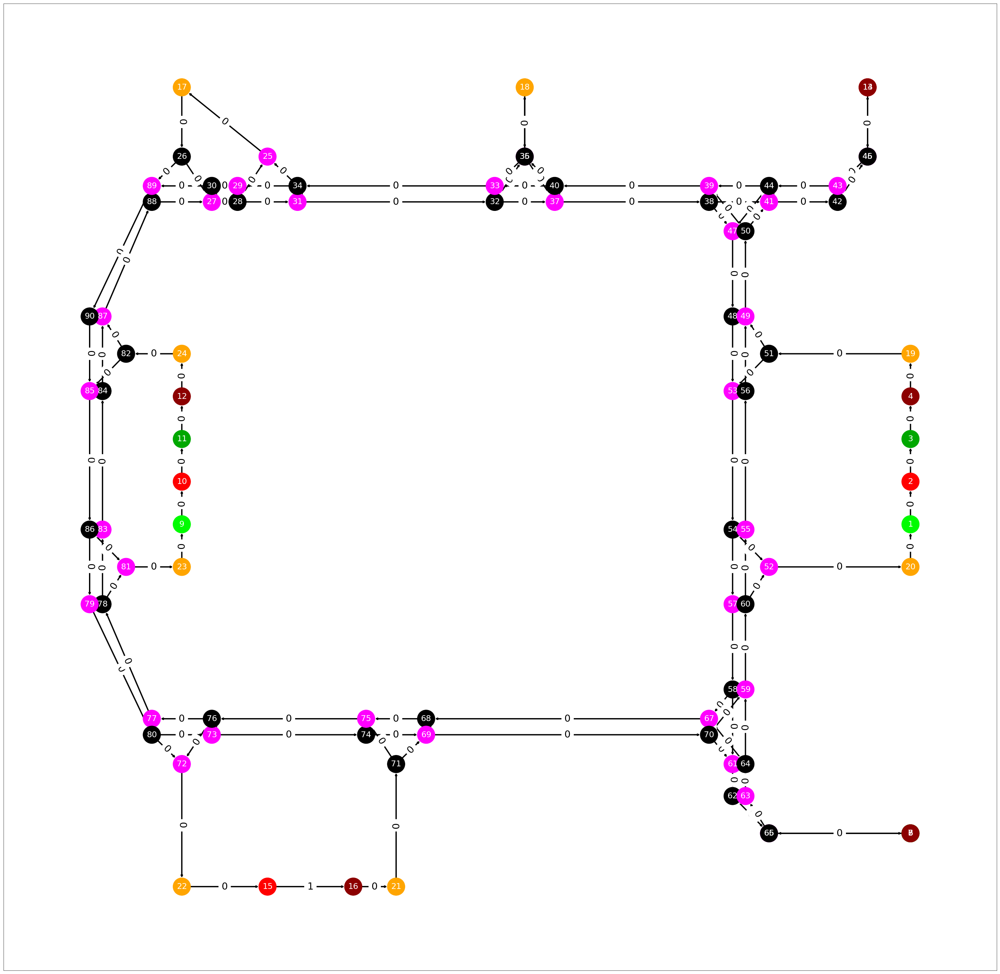


---------------------------Stan zadan---------------------------
taskId  robotId   WEIGHT              start_time          status    curr_beh_id    behaviours

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (15, 16)        15         10      True   True  


In [229]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

In [230]:
#przypisanie nowego zadania dojazdu do POI7 (z dokowaniem)
robots = [
    {"id": 1, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0}
] 

tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}},
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 1,
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['HIGH']
       },
]
robots_sim = sim.Robots(robots,5)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (11, 12)        25         20      True   True  


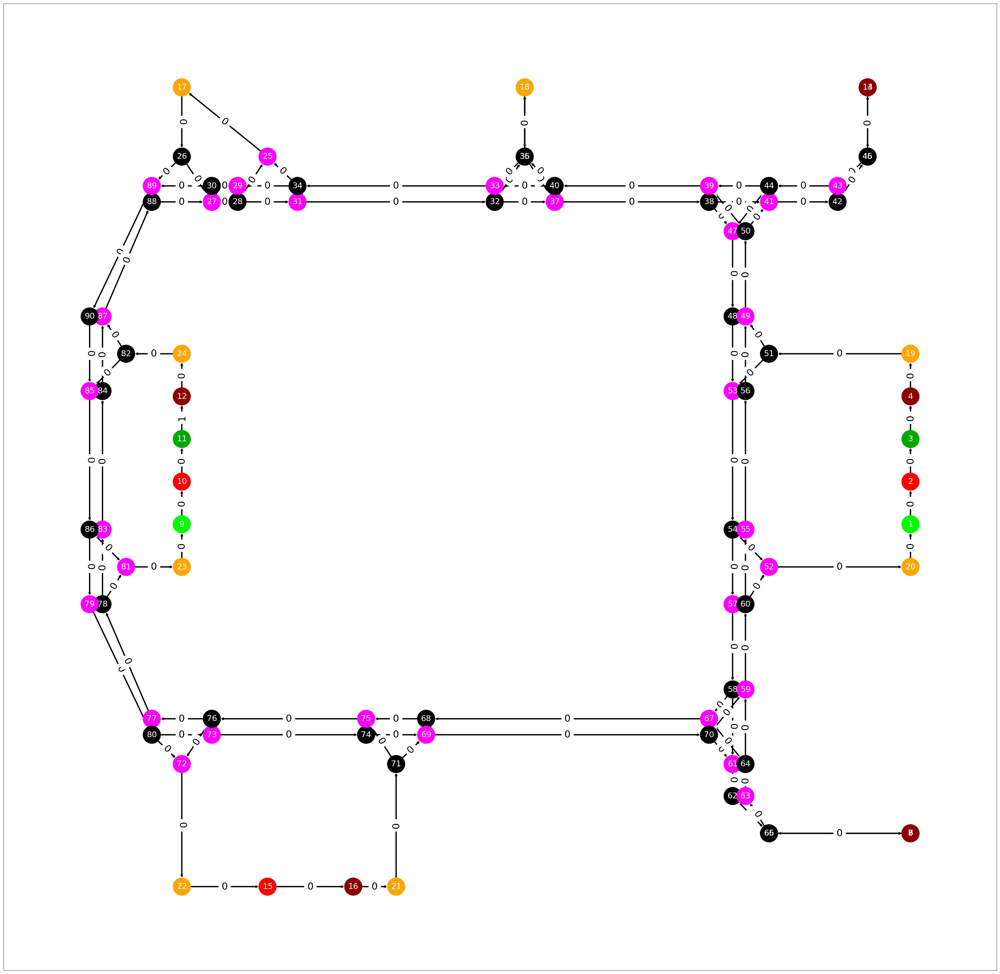


---------------------------Stan zadan---------------------------
taskId  robotId   WEIGHT              start_time          status    curr_beh_id    behaviours

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (11, 12)        30         20      True   True  


In [252]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

In [253]:
#przypisanie nowego zadania dojazdu do POI2 **********Nieprawidlowe zadanie, dojazd do poi ktore nie wymaga 
#dokowanie, a zadanie ma dokowanie
robots = [
    {"id": 1, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0}
] 

tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 2, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 1,
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['HIGH']
       },
]
robots_sim = sim.Robots(robots,5)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

In [263]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (35, 18)        5          4       True   True  
poi_node [] 2


IndexError: list index out of range

In [264]:
#ladowarka -błąd w strukturze zadania
#przypisanie nowego zadania dojazdu do ladowarki i kolejne akcje dojazdu do tego poi
robots = [
    {"id": 1, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0}
] 

tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 4, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 1,
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['HIGH']
       },
]

robots_sim = sim.Robots(robots,5)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (1, 2)          25         20      True   True  


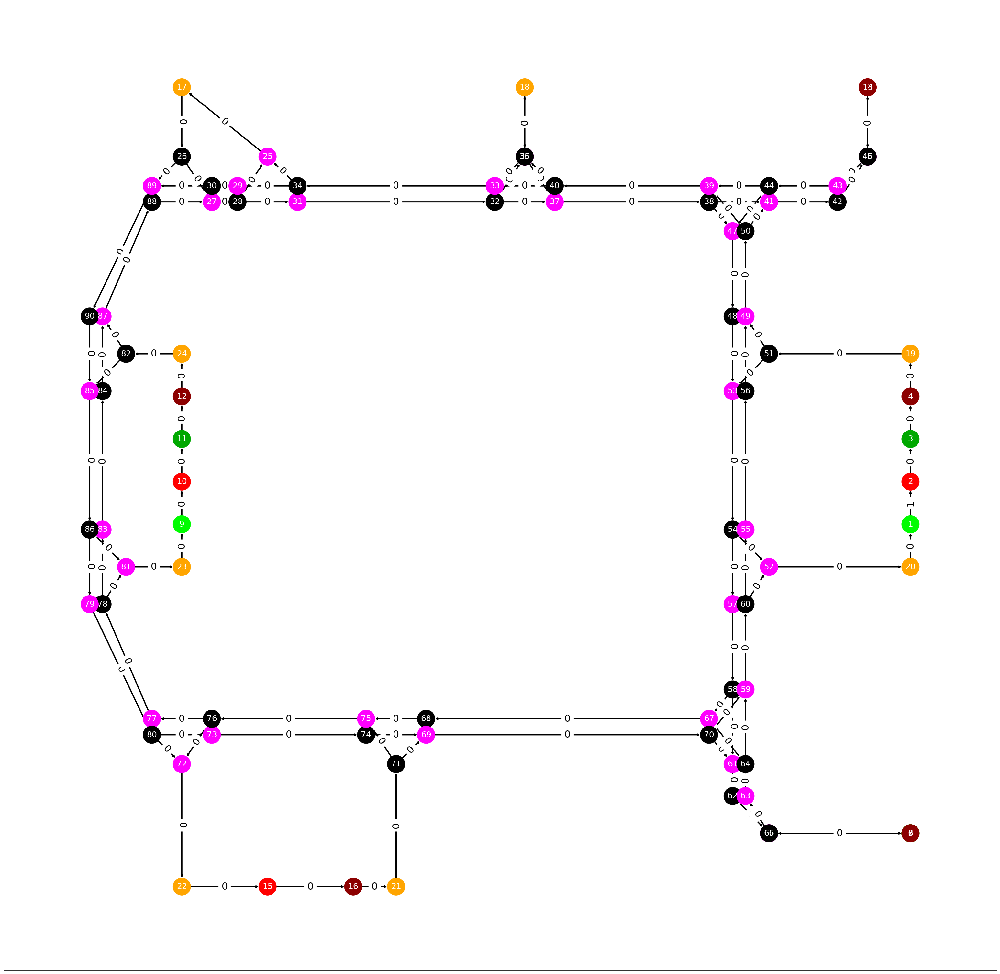


---------------------------Stan zadan---------------------------
taskId  robotId   WEIGHT              start_time          status    curr_beh_id    behaviours

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (1, 2)          30         20      True   True  


In [290]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

#  Test 2 
### sprawdzenie czy w danej chwili obslugiwanych jest wiele robotow, dla ulatwienia cele wyznaczone sa tak, ze sciezki robotow nie przecinaja sie

In [311]:
robots = [
    {"id": 1, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 2, "edge": (33,34), "planningOn": True, "isFree": True, "timeRemaining": 0}
] 

tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 6, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 0,
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['NORMAL']
       },
       {"id": 2,
        "behaviours": [{"id": 1, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 2,
        "start_time": "2018-06-29 07:45:27.243860",
        "weight": PRIORITY['NORMAL']
       }
]
robots_sim = sim.Robots(robots,3)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (15, 16)        45         10      True   True  
2         2      (11, 12)        21         20      True   True  


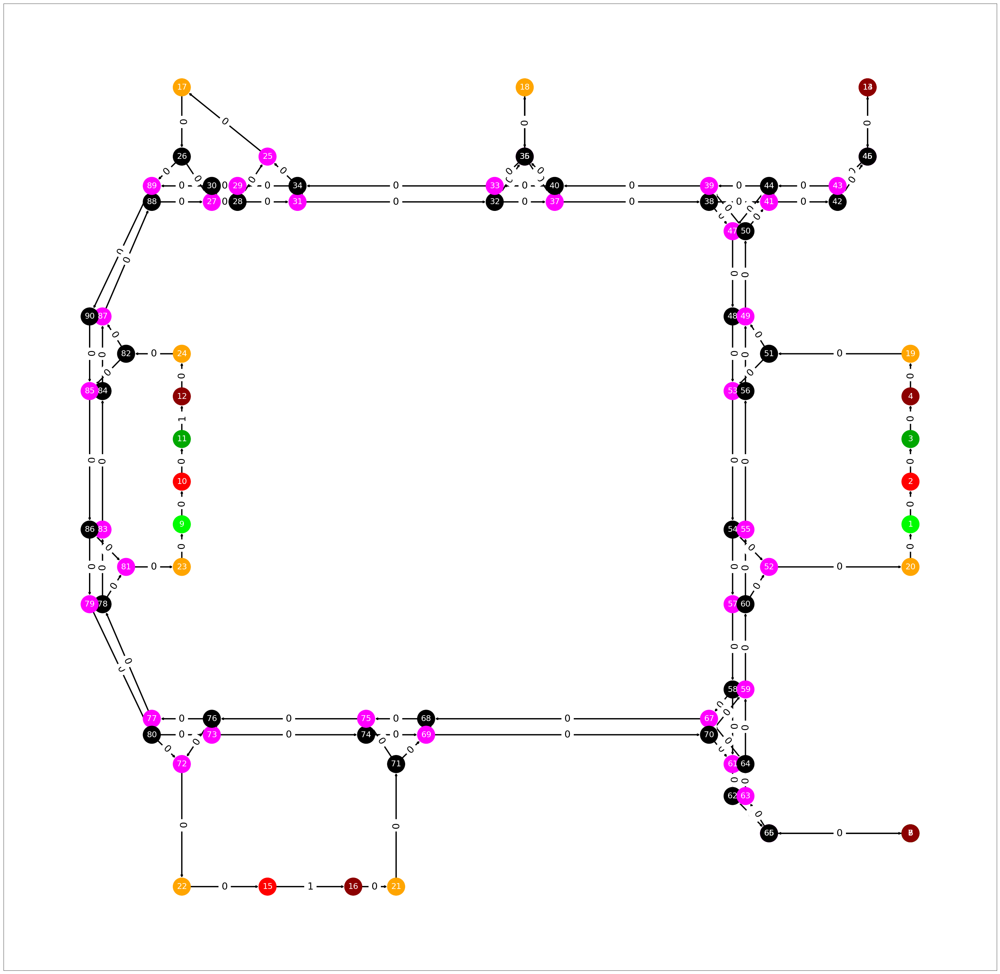


---------------------------Stan zadan---------------------------
taskId  robotId   WEIGHT              start_time          status    curr_beh_id    behaviours

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (15, 16)        48         10      True   True  
2         2      (11, 12)        24         20      True   True  


In [348]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

# Test 3
### w systemie sa nieprzypisane zadania dojazdu do tego samegoPOI

In [5]:
robots = [
    {"id": 1, "edge": (75,76), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 2, "edge": (79,80), "planningOn": True, "isFree": True, "timeRemaining": 0}
] 

tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 6, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 0,
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['NORMAL']
       },
       {"id": 2,
        "behaviours": [{"id": 1, "parameters": {"to": 6, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 0,
        "start_time": "2018-06-29 07:45:27.243860",
        "weight": PRIORITY['NORMAL']
       }
]
robots_sim = sim.Robots(robots,1)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         2      (15, 16)        12         10      True   True  
2         1      (72, 22)        18         6       True   False 


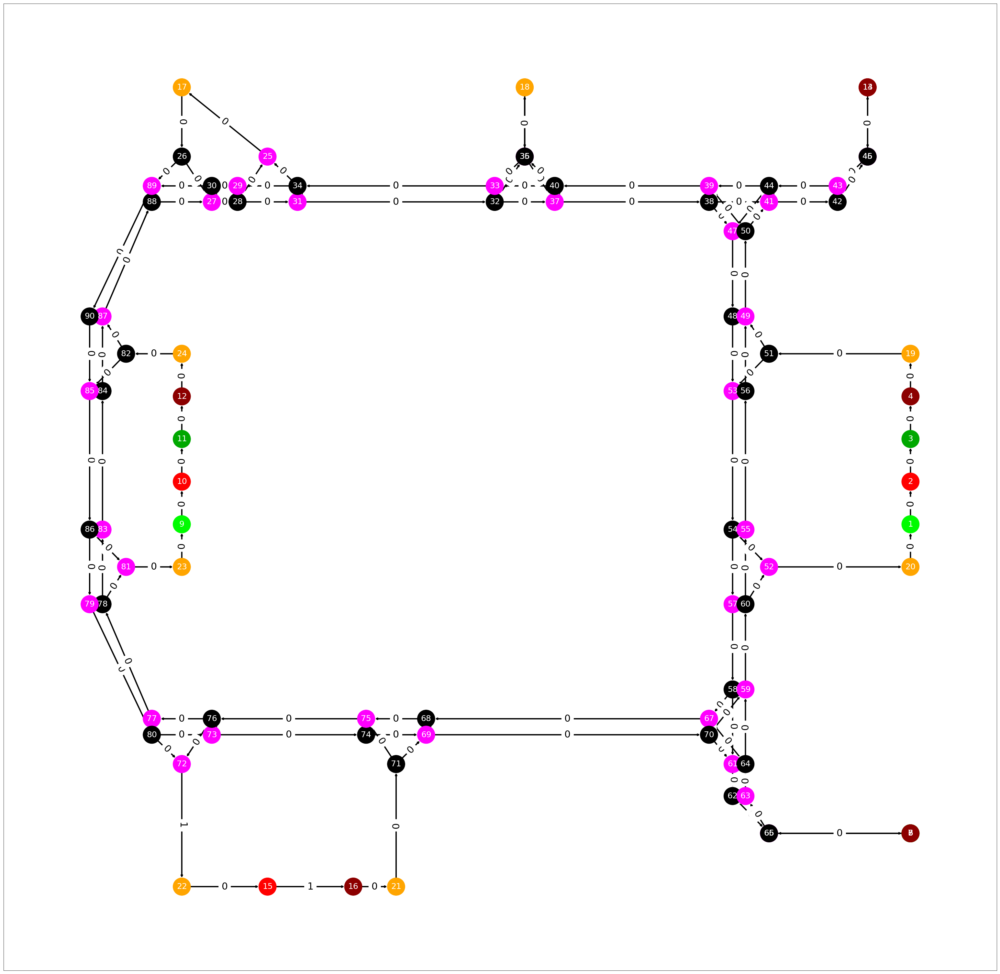


---------------------------Stan zadan---------------------------
taskId  robotId   WEIGHT              start_time          status    curr_beh_id    behaviours
1          2          3      2018-06-29 07:55:27.243860    IN_PROGRESS    0         id name goalId 
                                                                                    1   1      6
                                                                                    2   3

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         2      (15, 16)        13         10      True   True  
2         1      (72, 22)        19         6       True   False 


In [31]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

# Test 4 
### roboty z kazdej strony dojezdzaja do skrzyzowania dwa jada glowna trasa a trzeci odjezdza od POI

In [48]:
# weryfikacja pierwszenstwa przejazdu przez skrzyzowanie gdy zadania maja rozne priorytety,
# skrzyzowanie przy POI 6
robots = [
    {"id": 1, "edge": (73,74), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 2, "edge": (67,68), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 3, "edge": (21,71), "planningOn": True, "isFree": True, "timeRemaining": 0}
] 

tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 0,
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['HIGH']
       },
       {"id": 2,
        "behaviours": [{"id": 1, "parameters": {"to": 3, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 0,
        "start_time": "2018-06-29 07:45:27.243860",
        "weight": PRIORITY['NORMAL']
       },
       {"id": 3,
        "behaviours": [{"id": 1, "parameters": {"to": 5, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 0,
        "start_time": "2018-06-29 07:25:27.243860",
        "weight": PRIORITY['LOW']
       }
]
robots_sim = sim.Robots(robots,1)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (11, 12)        28         20      True   True  
2         2      (13, 14)        27         10      True   True  
3         3      (7, 8)          20         20      True   True  


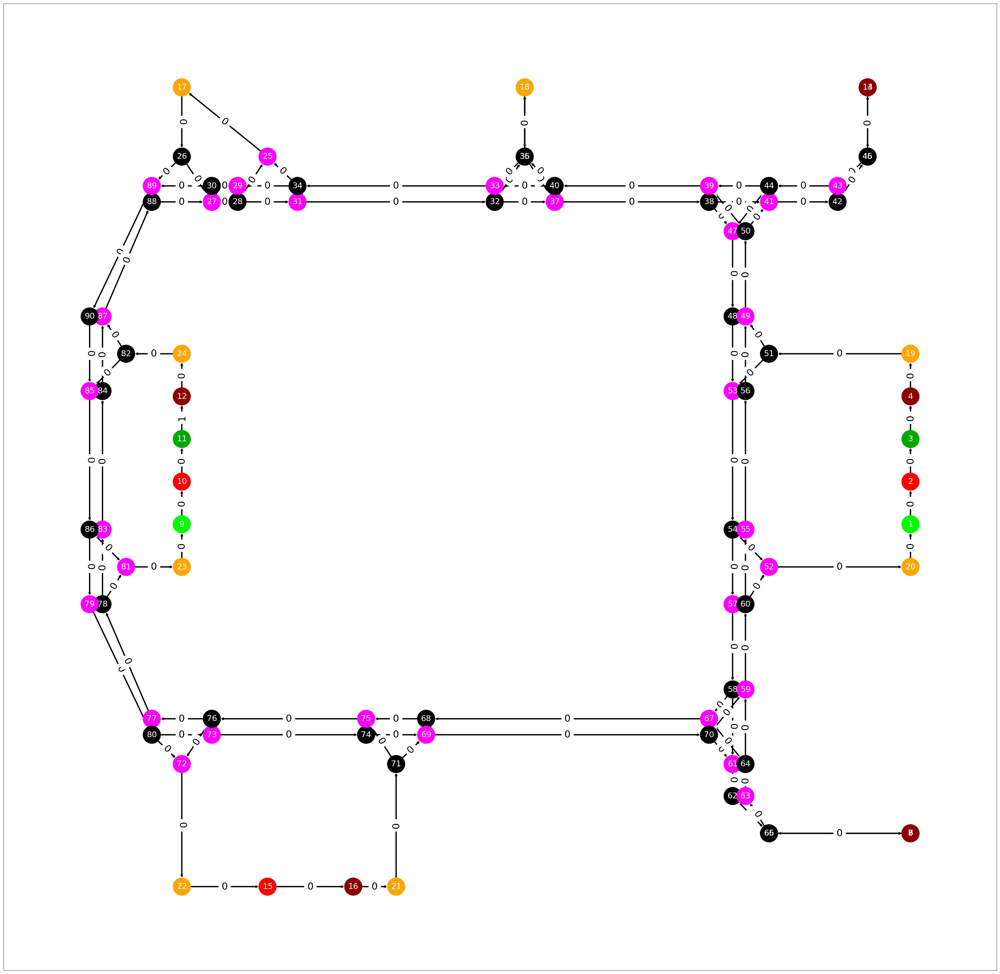


---------------------------Stan zadan---------------------------
taskId  robotId   WEIGHT              start_time          status    curr_beh_id    behaviours

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (11, 12)        29         20      True   True  
2         2      (13, 14)        28         10      True   True  
3         3      (7, 8)          21         20      True   True  


In [144]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

In [191]:
# weryfikacja pierwszenstwa przejazdu przez skrzyzowanie, gdy wszystkie zadania maja ten sam priorytet
# skrzyzowanie przy POI 6
robots = [
    {"id": 1, "edge": (73,74), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 2, "edge": (67,68), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 3, "edge": (21,71), "planningOn": True, "isFree": True, "timeRemaining": 0}
] 

tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 0,
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['NORMAL']
       },
       {"id": 2,
        "behaviours": [{"id": 1, "parameters": {"to": 3, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 0,
        "start_time": "2018-06-29 07:15:27.243860",
        "weight": PRIORITY['NORMAL']
       },
       {"id": 3,
        "behaviours": [{"id": 1, "parameters": {"to": 5, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 0,
        "start_time": "2018-06-29 07:25:27.243860",
        "weight": PRIORITY['NORMAL']
       }
]
robots_sim = sim.Robots(robots,2)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         2      (13, 14)        34         10      True   True  
2         3      (7, 8)          28         20      True   True  
3         1      (11, 12)        22         20      True   True  


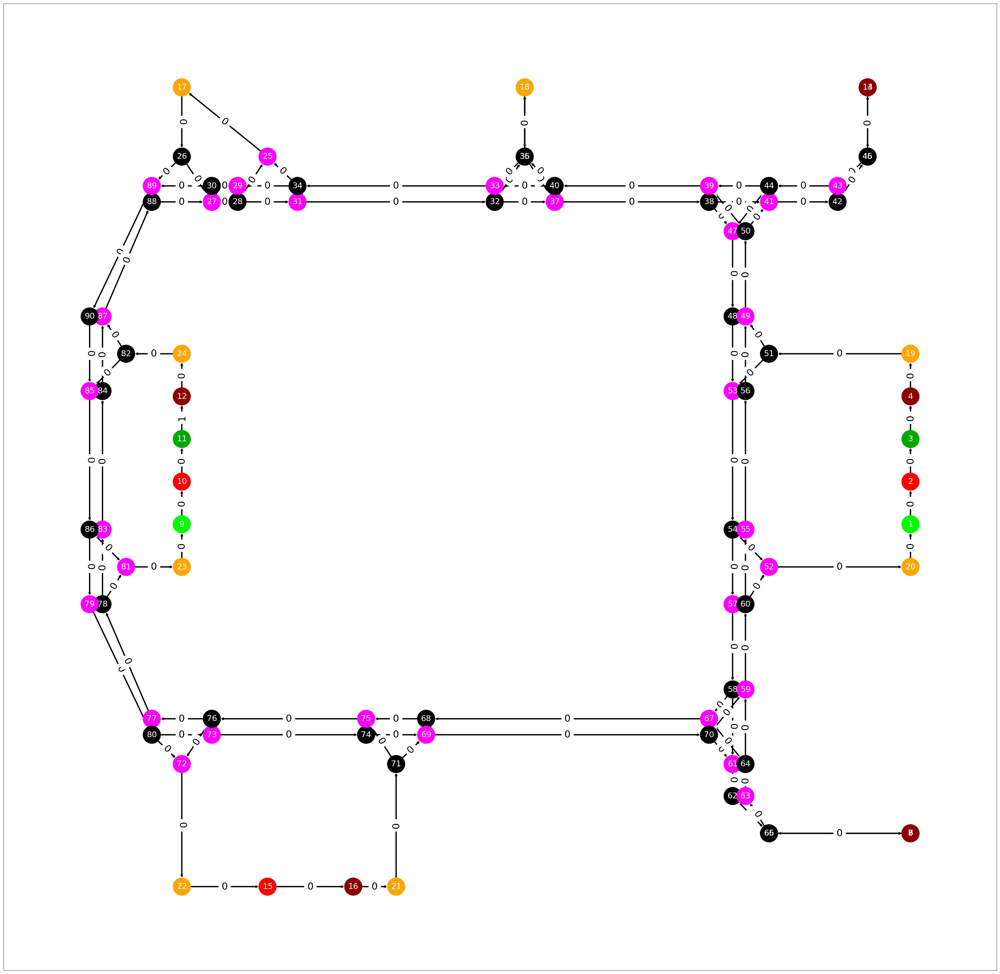


---------------------------Stan zadan---------------------------
taskId  robotId   WEIGHT              start_time          status    curr_beh_id    behaviours

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         2      (13, 14)        36         10      True   True  
2         3      (7, 8)          30         20      True   True  
3         1      (11, 12)        24         20      True   True  


In [244]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

In [249]:
# przejazd rzez skrzyzowanie, zadania na sztywno przypisane do robotow
# skrzyzowanie przy POI 6
robots = [
    {"id": 1, "edge": (73,74), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 2, "edge": (67,68), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 3, "edge": (21,71), "planningOn": True, "isFree": True, "timeRemaining": 0}
] 

tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 2,
        "start_time": "2018-06-29 07:15:27.243860",
        "weight": PRIORITY['HIGH']
       },
       {"id": 2,
        "behaviours": [{"id": 1, "parameters": {"to": 3, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 1,
        "start_time": "2018-06-29 07:45:27.243860",
        "weight": PRIORITY['NORMAL']
       },
       {"id": 3,
        "behaviours": [{"id": 1, "parameters": {"to": 5, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 3,
        "start_time": "2018-06-29 07:25:27.243860",
        "weight": PRIORITY['NORMAL']
       }
]
robots_sim = sim.Robots(robots,3)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())
#kolejnosc zjazdu ze skrzyzowania prawy (2), dolny (3), a pozniej lewy (1) robot

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         2      (13, 14)        21         10      True   True  
2         1      (11, 12)        24         20      True   True  
3         3      (7, 8)          21         20      True   True  


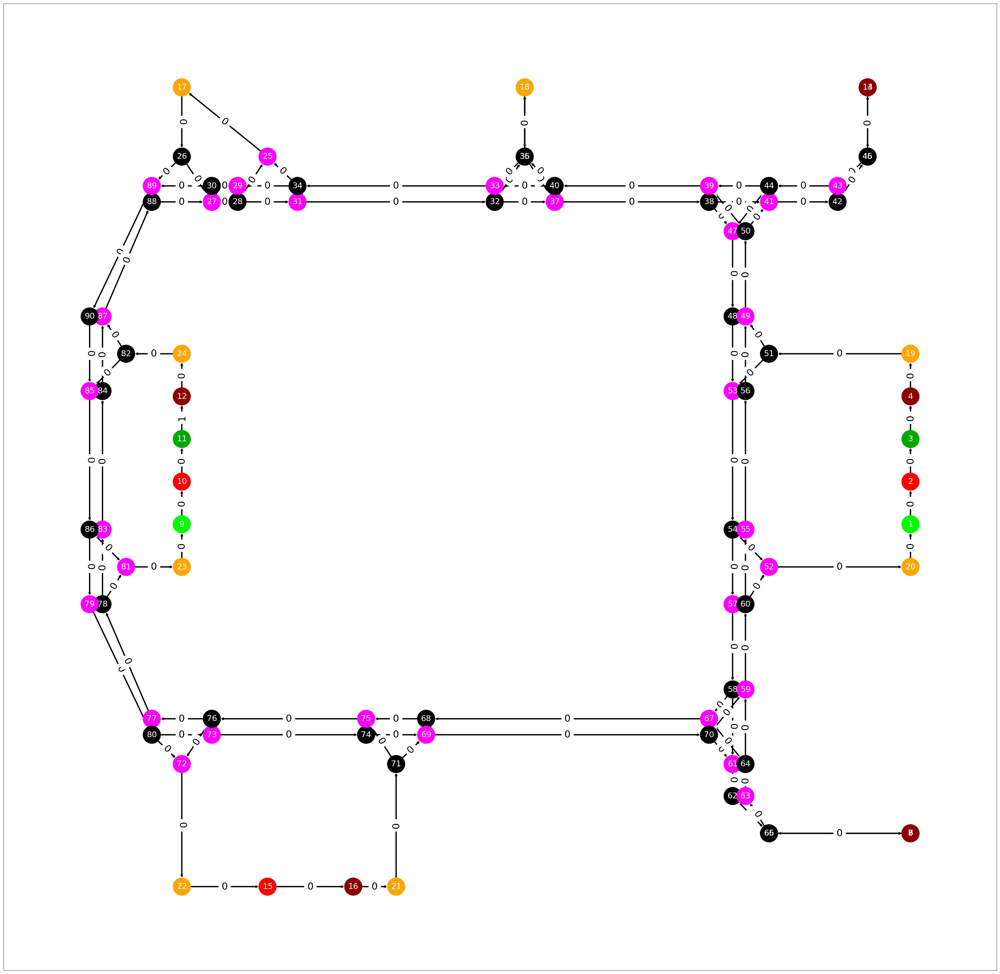


---------------------------Stan zadan---------------------------
taskId  robotId   WEIGHT              start_time          status    curr_beh_id    behaviours

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         2      (13, 14)        24         10      True   True  
2         1      (11, 12)        27         20      True   True  
3         3      (7, 8)          24         20      True   True  


In [284]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

# Test 5 
### dwa roboty jada do tego samego POI, po kilku akcjach pojawia sie nowe zadanie dla wolnego robota

In [388]:
# przejazd rzez skrzyzowanie, zadania na sztywno przypisane do robotow
# skrzyzowanie przy POI 6
robots = [
    {"id": 1, "edge": (75,76), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 2, "edge": (79,80), "planningOn": True, "isFree": True, "timeRemaining": 0}
] 

tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 6, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 2,
        "start_time": "2018-06-29 07:15:27.243860",
        "weight": PRIORITY['HIGH']
       },
       {"id": 2,
        "behaviours": [{"id": 1, "parameters": {"to": 6, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 1,
        "start_time": "2018-06-29 07:45:27.243860",
        "weight": PRIORITY['NORMAL']
       }
]
robots_sim = sim.Robots(robots,2)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

In [404]:
task =  {"id": 3,
        "behaviours": [{"id": 1, "parameters": {"to": 5, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 0,
        "start_time": "2018-06-29 07:25:27.243860",
        "weight": PRIORITY['NORMAL']
       }
supervisor_sim.add_task(task)

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         2      (15, 16)        92         10      True   True  
2         3      (7, 8)          22         20      True   True  


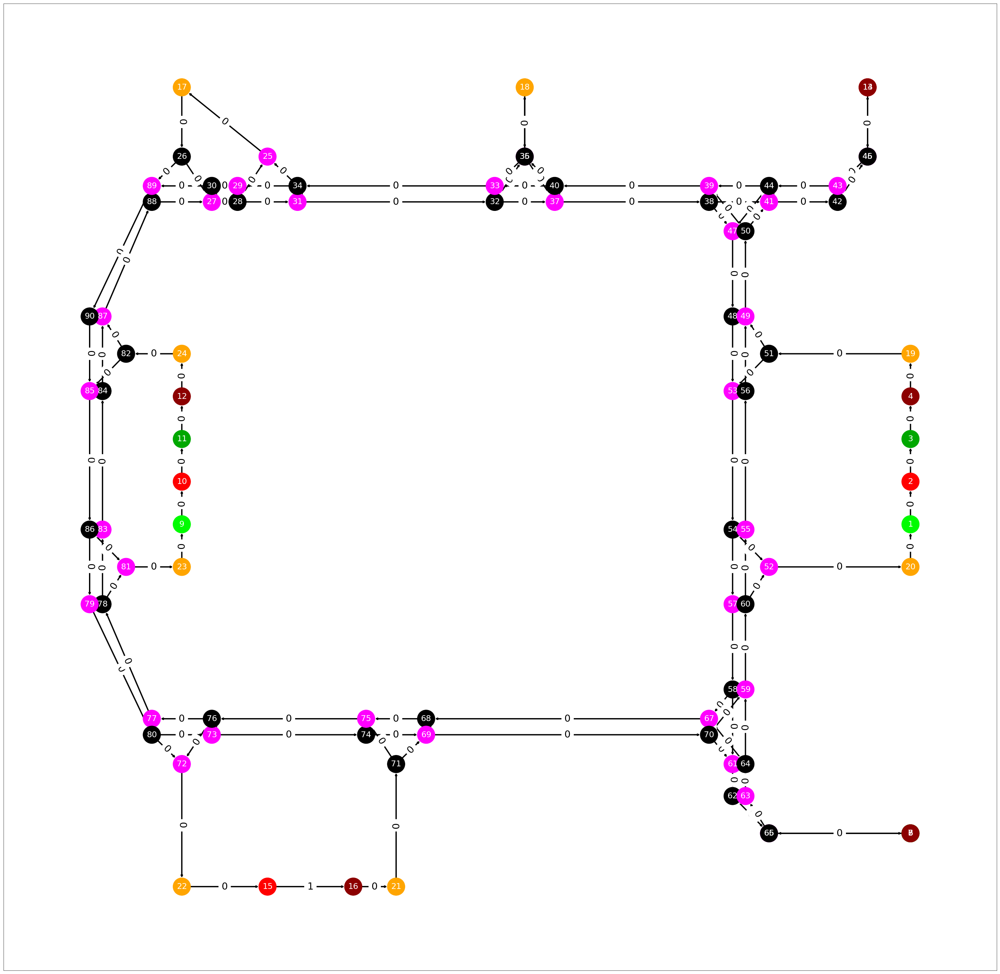


---------------------------Stan zadan---------------------------
taskId  robotId   WEIGHT              start_time          status    curr_beh_id    behaviours

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         2      (15, 16)        94         10      True   True  
2         3      (7, 8)          24         20      True   True  


In [457]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

# Test 6
### ruch robotow przy skrzyżowaniach

In [458]:
# przejazd rzez skrzyzowanie, zadania na sztywno przypisane do robotow
# skrzyzowanie przy POI 6
robots = [
    {"id": 1, "edge": (75,76), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 2, "edge": (79,80), "planningOn": True, "isFree": True, "timeRemaining": 0}
] 

tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 6, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 2,
        "start_time": "2018-06-29 07:15:27.243860",
        "weight": PRIORITY['HIGH']
       },
       {"id": 2,
        "behaviours": [{"id": 1, "parameters": {"to": 6, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 1,
        "start_time": "2018-06-29 07:45:27.243860",
        "weight": PRIORITY['NORMAL']
       }
]
robots_sim = sim.Robots(robots,2)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         2      (72, 22)        4          6       False  False 
2         1      (22, 15)        4          4       True   True  


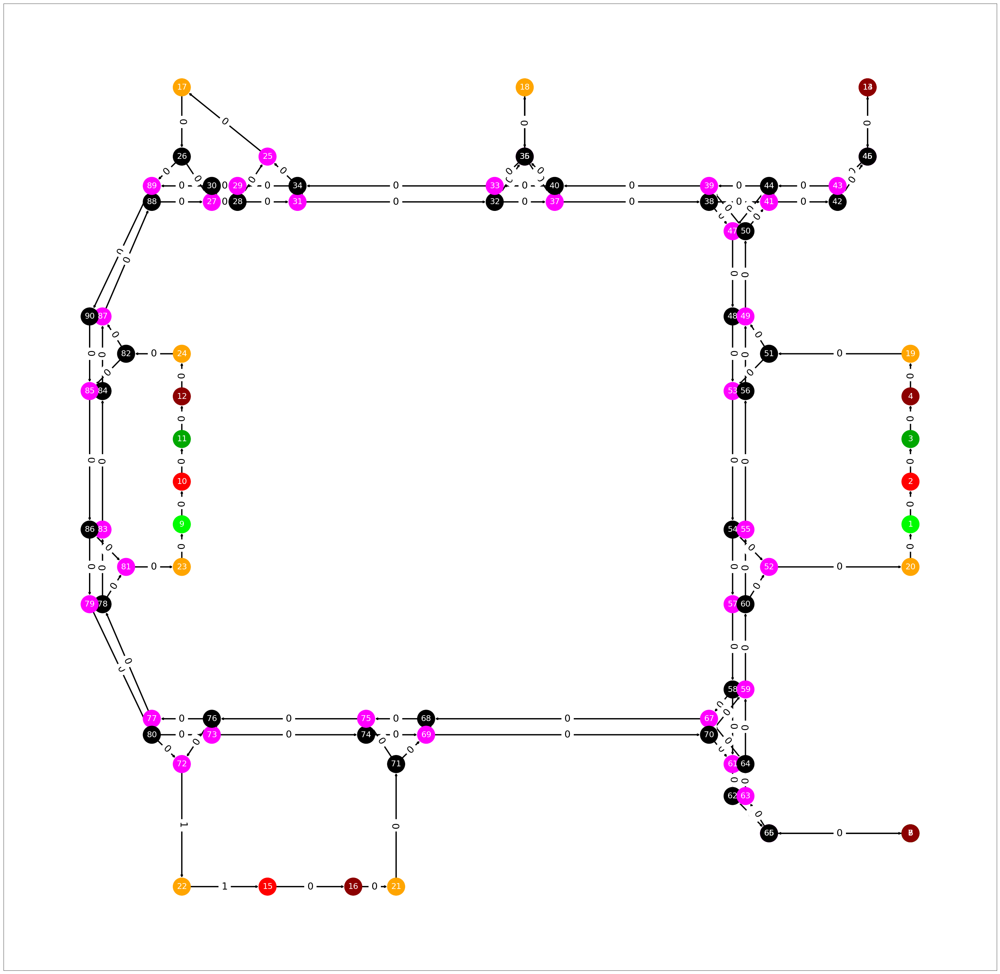


---------------------------Stan zadan---------------------------
taskId  robotId   WEIGHT              start_time          status    curr_beh_id    behaviours
1          2          4      2018-06-29 07:15:27.243860    IN_PROGRESS    1         id name goalId 
                                                                                    1   1      6
                                                                                    2   3
2          1          3      2018-06-29 07:45:27.243860    IN_PROGRESS    0         id name goalId 
                                                                                    1   1      6
                                                                                    2   3

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
2            1      (15, 16)     True       10     
---------------------------Robots---------------------------
robotId   taskId   edge     behDura

In [466]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

# Test 7
### Wyslanie do POI 7 wiecej robotow niz wynika z liczby robotow ktora moze obsluzyc stanowisko
(max 6 --- 1 w POI, 5 na krawedzi) niz wynika ze stanowiska, -> zadania przypisuje dispatcher dla robotow stojacych w innych poi, a dla tych co sa w trasie sa przypisane. 4 w trasie
Przypisane powinny byc zadania tak aby maksymalnie 6 robotow jechalo do POI.
Weryfikacja czy przy zablokowanym POI pierwszy nowe zadanie dostanie robot znajdujacy sie w danym POI

In [5]:
robots = [
    {"id": 1, "edge": (67,68), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 2, "edge": (33,34), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 3, "edge": (89,90), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 4, "edge": (85,86), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 5, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 6, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 7, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0}
] 

tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}], 
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 1,
        "start_time": "2018-06-29 07:15:27.243860",
        "weight": PRIORITY['HIGH']
       },
       {"id": 2,
        "behaviours": [{"id": 1, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}], 
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 2,
        "start_time": "2018-06-29 07:18:27.243860",
        "weight": PRIORITY['NORMAL']
       },
       {"id": 3,
        "behaviours": [{"id": 1, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}], 
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 3,
        "start_time": "2018-06-29 07:19:27.243860",
        "weight": PRIORITY['HIGH']
       },
       {"id": 4,
        "behaviours": [{"id": 1, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 4,
        "start_time": "2018-06-29 07:22:27.243860",
        "weight": PRIORITY['NORMAL']
       },
       {"id": 5,
        "behaviours": [{"id": 1, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}], 
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 0,
        "start_time": "2018-06-29 07:24:27.243860",
        "weight": PRIORITY['HIGH']
       },
       {"id": 6,
        "behaviours": [{"id": 1, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],  
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 0,
        "start_time": "2018-06-29 07:27:27.243860",
        "weight": PRIORITY['NORMAL']
       },
       {"id": 7,
        "behaviours": [{"id": 1, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}], 
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 0,
        "start_time": "2018-06-29 07:29:27.243860",
        "weight": PRIORITY['HIGH']
       },
       {"id": 8,
        "behaviours": [{"id": 1, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}], 
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 0,
        "start_time": "2018-06-29 07:35:27.243860",
        "weight": PRIORITY['NORMAL']
       }
]
robots_sim = sim.Robots(robots,5)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         None   (67, 68)        0          0       True   False 
2         None   (33, 34)        0          0       True   False 
3         None   (89, 90)        0          0       True   False 
4         None   (85, 86)        0          0       True   False 
5         None   (25, 17)        0          0       True   False 
6         None   (25, 17)        0          0       True   False 
7         None   (25, 17)        0          0       True   False 
robots_using_poi {1: 3, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0} max_robots_in_poi {1: 10, 2: 1, 3: 8, 4: 11, 5: 6, 6: 8, 7: 6}
free_slots_in_poi {1: 7, 2: 1, 3: 8, 4: 11, 5: 6, 6: 8, 7: 6}
all_free_tasks
available slot, free slots 6
available slot, free slots 5
available slot, free slots 4
robots_using_poi {1: 3, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0} max_robots_in_poi {1: 10, 2: 1, 3: 8, 4: 11, 5: 6, 6: 8, 7: 6}
f

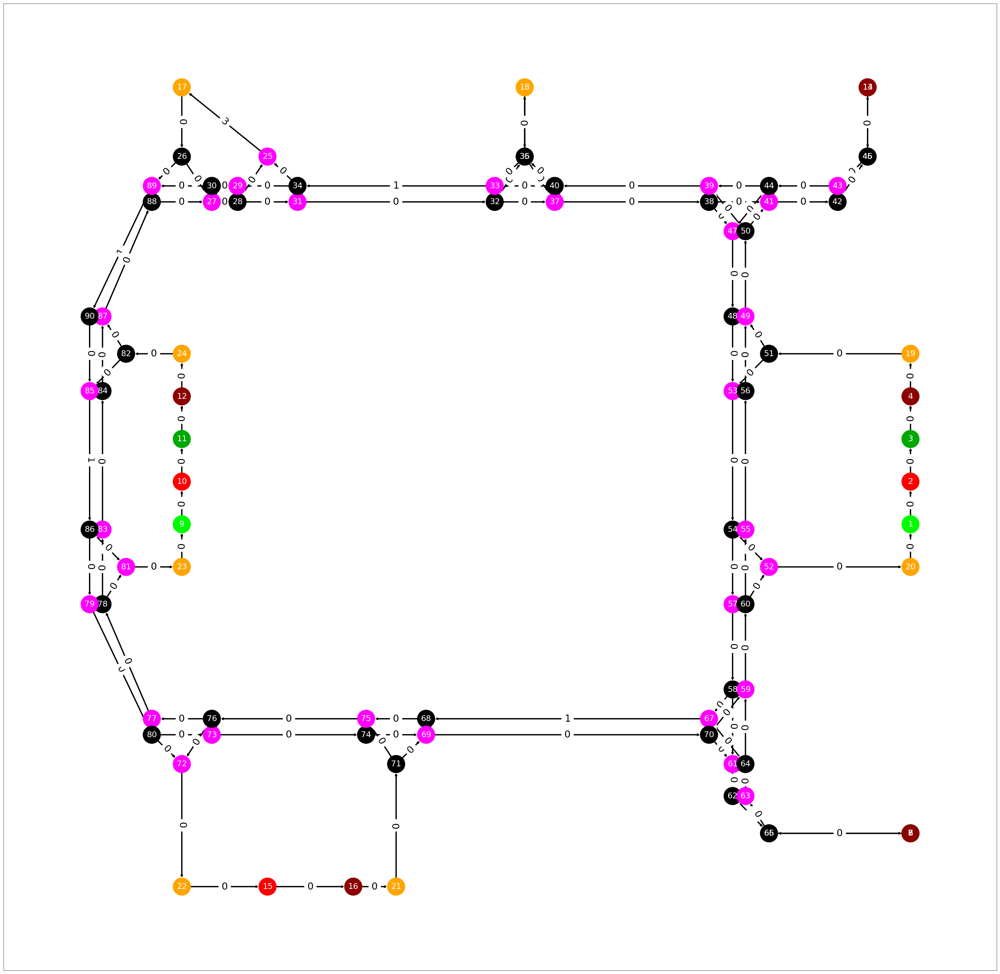

In [6]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

In [7]:
#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()


---------------------------Stan zadan---------------------------
taskId  robotId   WEIGHT              start_time          status    curr_beh_id    behaviours
1          1          4      2018-06-29 07:15:27.243860    IN_PROGRESS    0         id name goalId 
                                                                                    1   1      7
                                                                                    2   2
                                                                                    3   3
                                                                                    4   4
2          2          3      2018-06-29 07:18:27.243860    IN_PROGRESS    0         id name goalId 
                                                                                    1   1      7
                                                                                    2   2
                                                                                    3 

# Test 7
### Weryfikacja czasow trwania
1. ustawiany krok wykonania czasowy wykonania zachowania
2. weryfikacja dispatchera i czasow przejscia danymi krawedziami

In [473]:
robots = [
    {"id": 1, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 2, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 3, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0}
] 
tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 4, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 1,
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['HIGH']
       },
        {"id": 2,
        "behaviours": [{"id": 1, "parameters": {"goalId": 6, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 0,
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['HIGH']
       },
]
robots_sim = sim.Robots(robots,0.5)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (31, 32)        0.5        12      False  False 
2         2      (89, 90)        4.0        10      False  False 
3         None   (25, 17)        0          0       True   False 


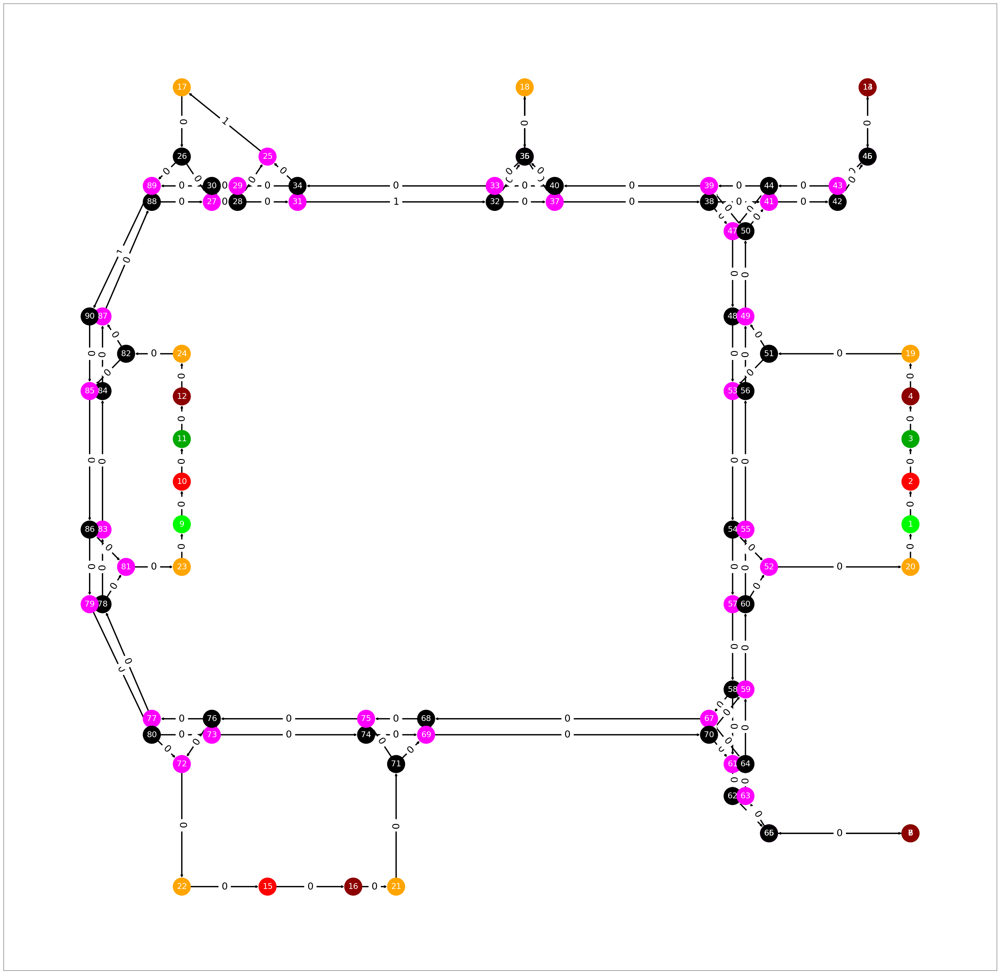


---------------------------Stan zadan---------------------------
taskId  robotId   priority            timeAdded                   behaviours
1          1          3      2018-06-29 07:55:27.243860    id name goalId status
                                                           1   1      4     2
                                                           2   2            1
                                                           3   3            1
                                                           4   4            1
2          2          3      2018-06-29 07:55:27.243860    id name goalId status
                                                           1   1      6     2
                                                           2   3            1

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime

In [503]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()


In [504]:
robots = [
    {"id": 1, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 2, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 3, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0}
] 
tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 4, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 1,
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['HIGH']
       },
        {"id": 2,
        "behaviours": [{"id": 1, "parameters": {"to": 6, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 0,
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['HIGH']
       }
]
robots_sim = sim.Robots(robots,1)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (3, 4)          20         20      True   True  
2         2      (15, 16)        66         10      True   True  
3         None   (25, 17)        0          0       True   False 


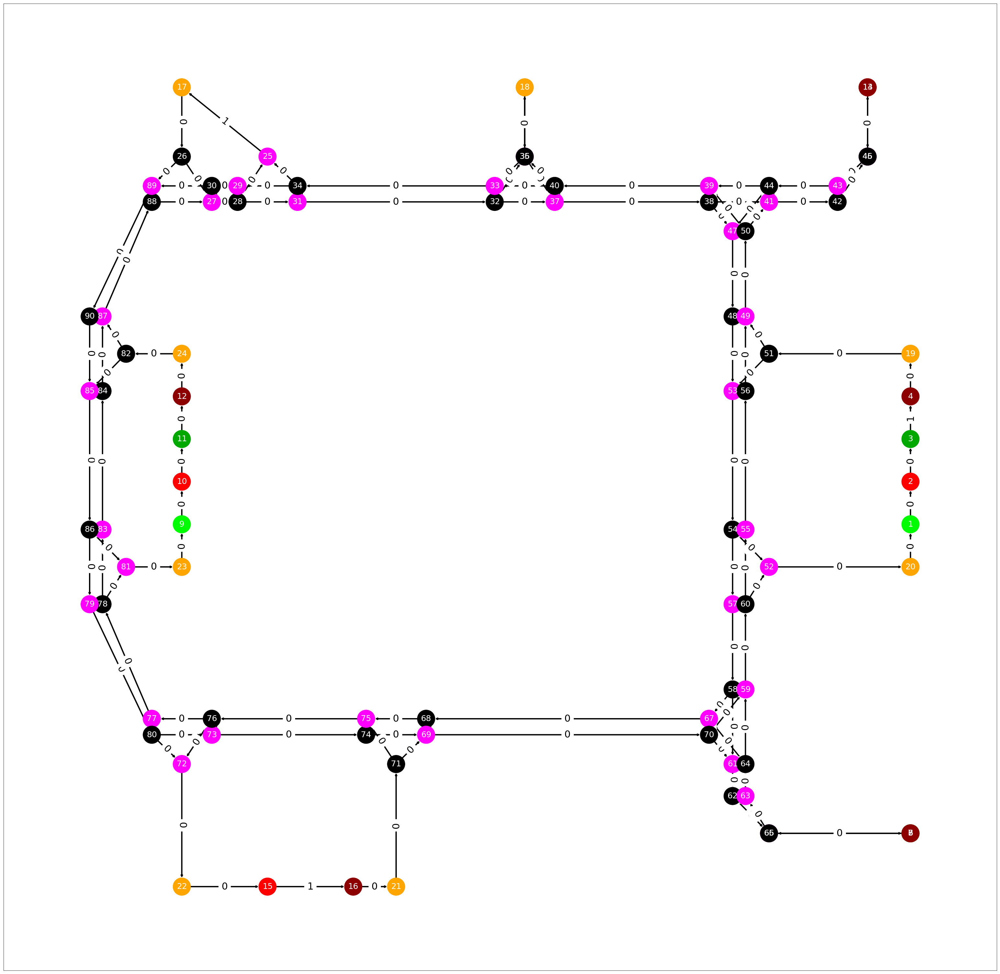


---------------------------Stan zadan---------------------------
taskId  robotId   priority            timeAdded                   behaviours

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (3, 4)          21         20      True   True  
2         2      (15, 16)        67         10      True   True  
3         None   (25, 17)        0          0       True   False 


In [629]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

# Test 8
Robot konczy czesc zadania, kolejnym zachowaniem jakie dostaje jest dojazd do POI (7) zajetego w calosci przez inne roboty. Taki robot nie powinien dostac akcji zachowania jazdy do tego POI (7)

In [630]:
robots = [
    {"id": 1, "edge": (43,44), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 2, "edge": (81,23), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 3, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 4, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 5, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 6, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0},
    {"id": 7, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0}
] 
tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 2,
        "start_time": "2018-06-29 07:58:27.243860",
        "weight": PRIORITY['NORMAL']
       },
       {"id": 2,
        "behaviours": [{"id": 1, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 3,
        "start_time": "2018-06-29 08:01:27.243860",
        "weight": PRIORITY['NORMAL']
       },
       {"id": 3,
        "behaviours": [{"id": 1, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 4,
        "start_time": "2018-06-29 08:05:27.243860",
        "weight": PRIORITY['NORMAL']
       },
       {"id": 4,
        "behaviours": [{"id": 1, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 5,
        "start_time": "2018-06-29 08:07:27.243860",
        "weight": PRIORITY['NORMAL']
       },
       {"id": 5,
        "behaviours": [{"id": 1, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 6,
        "start_time": "2018-06-29 08:08:27.243860",
        "weight": PRIORITY['NORMAL']
       },
       {"id": 6,
        "behaviours": [{"id": 1, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 7,
        "start_time": "2018-06-29 08:10:27.243860",
        "weight": PRIORITY['NORMAL']
       },
       {"id": 7,
        "behaviours": [{"id": 1, "parameters": {"to": 6, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 3, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 5, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 6, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 1,
        "start_time": "2018-06-29 07:52:27.243860",
        "weight": PRIORITY['NORMAL']
       }
]
robots_sim = sim.Robots(robots,1)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         7      (21, 71)        10         6       True   False 
2         1      (11, 12)        130        20      True   True  
3         2      (81, 23)        110        4       True   False 
4         3      (81, 23)        90         4       True   False 
5         4      (81, 23)        70         4       True   False 
6         5      (81, 23)        50         4       True   False 
7         6      (81, 23)        30         4       True   False 


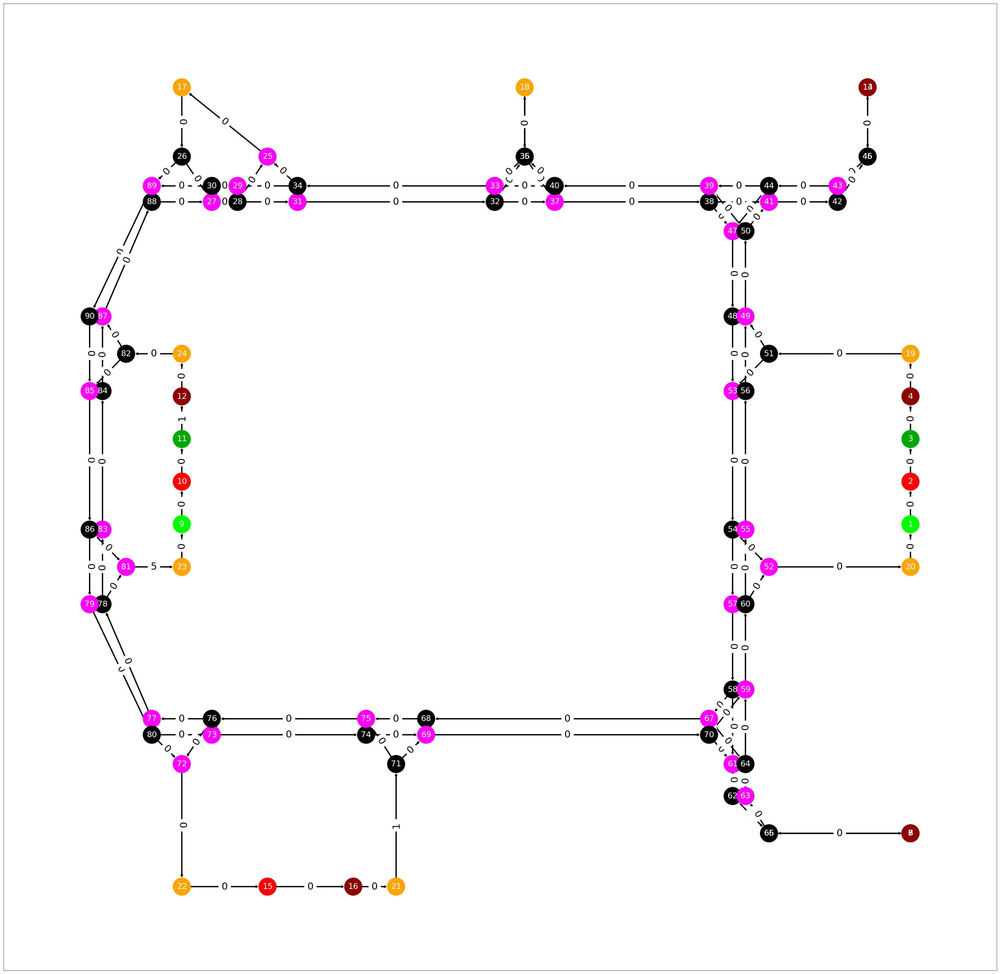

In [648]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

In [391]:
#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()


---------------------------Stan zadan---------------------------
taskId  robotId   priority            timeAdded                   behaviours
2          3          2      2018-06-29 08:01:27.243860    id name goalId status
                                                           1   1      7     2
                                                           2   2            1
                                                           3   3            1
                                                           4   4            1
3          4          2      2018-06-29 08:05:27.243860    id name goalId status
                                                           1   1      7     2
                                                           2   2            1
                                                           3   3            1
                                                           4   4            1
4          5          2      2018-06-29 08:07:27.243860    id name goal

# Test 9
Modyfikacja wag dla POI 6 tak, aby koszt przejazdu przez stanowisko 6 był mniejszy niż jazda główną trasą. 
Zaplanowana bedzie trasa naokolo do POI 4

In [663]:
robots = [
    {"id": 1, "edge": (79,80), "planningOn": True, "isFree": True, "timeRemaining": 0}
]
tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 4, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 1,
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['HIGH']
       }
]
robots_sim = sim.Robots(robots,10)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())
supervisor_sim.graph.graph.edges[73,74]["weight"] = 500
supervisor_sim.graph.graph.edges[80,72]["weight"] = 1
supervisor_sim.graph.graph.edges[72,22]["weight"] = 1
supervisor_sim.graph.graph.edges[22,15]["weight"] = 1
supervisor_sim.graph.graph.edges[15,16]["weight"] = 1
supervisor_sim.graph.graph.edges[16,21]["weight"] = 1
supervisor_sim.graph.graph.edges[21,71]["weight"] = 1
supervisor_sim.graph.graph.edges[71,69]["weight"] = 1

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (3, 4)          20         20      True   True  


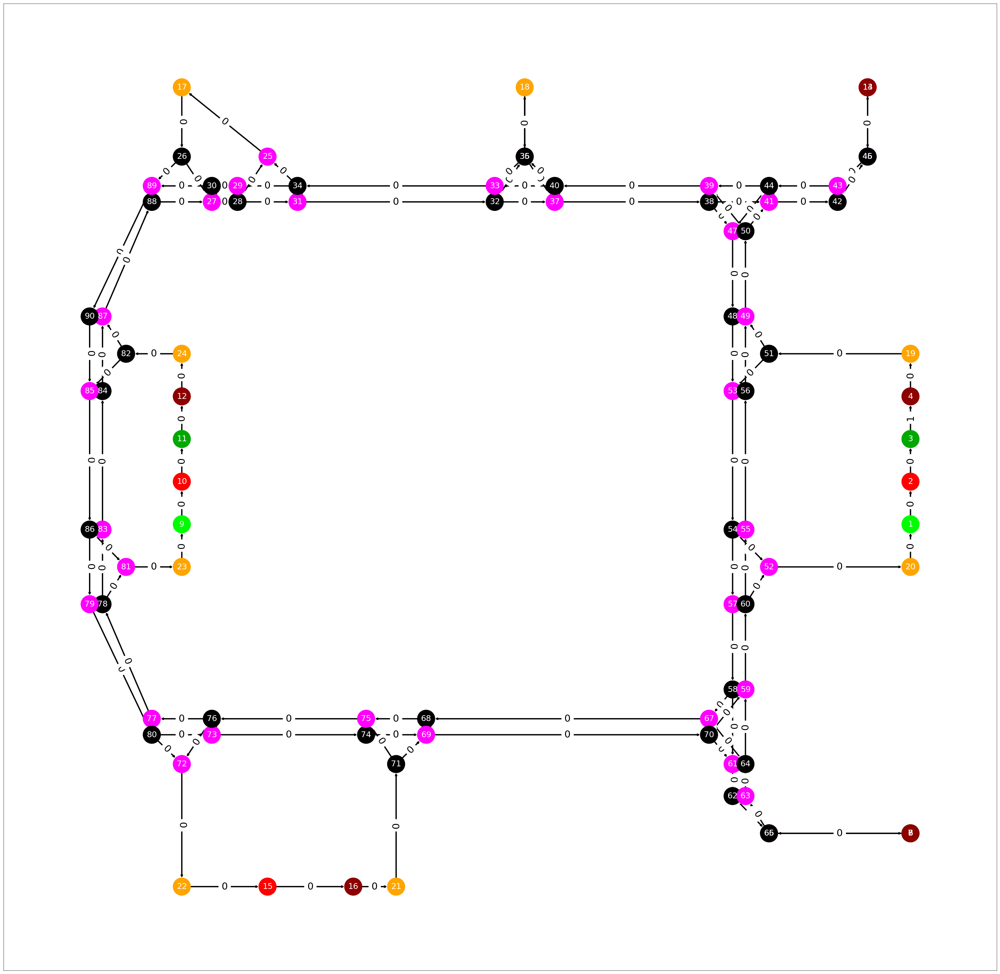


---------------------------Stan zadan---------------------------
taskId  robotId   priority            timeAdded                   behaviours

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (3, 4)          30         20      True   True  


In [689]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

# Test 10
### Przejazd przez wiele POI

In [3]:
robots = [
    {"id": 1, "edge": (67,68), "planningOn": True, "isFree": True, "timeRemaining": 0}
]
tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 6, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 3, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 5, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 6, "parameters": {"name": disp.Behaviour.TYPES["undock"]}},
                       {"id": 7, "parameters": {"to": 6, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 8, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 9, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 10, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 11, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 12, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 1,
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['HIGH']
       }
]
robots_sim = sim.Robots(robots,10)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (11, 12)        20         20      True   True  


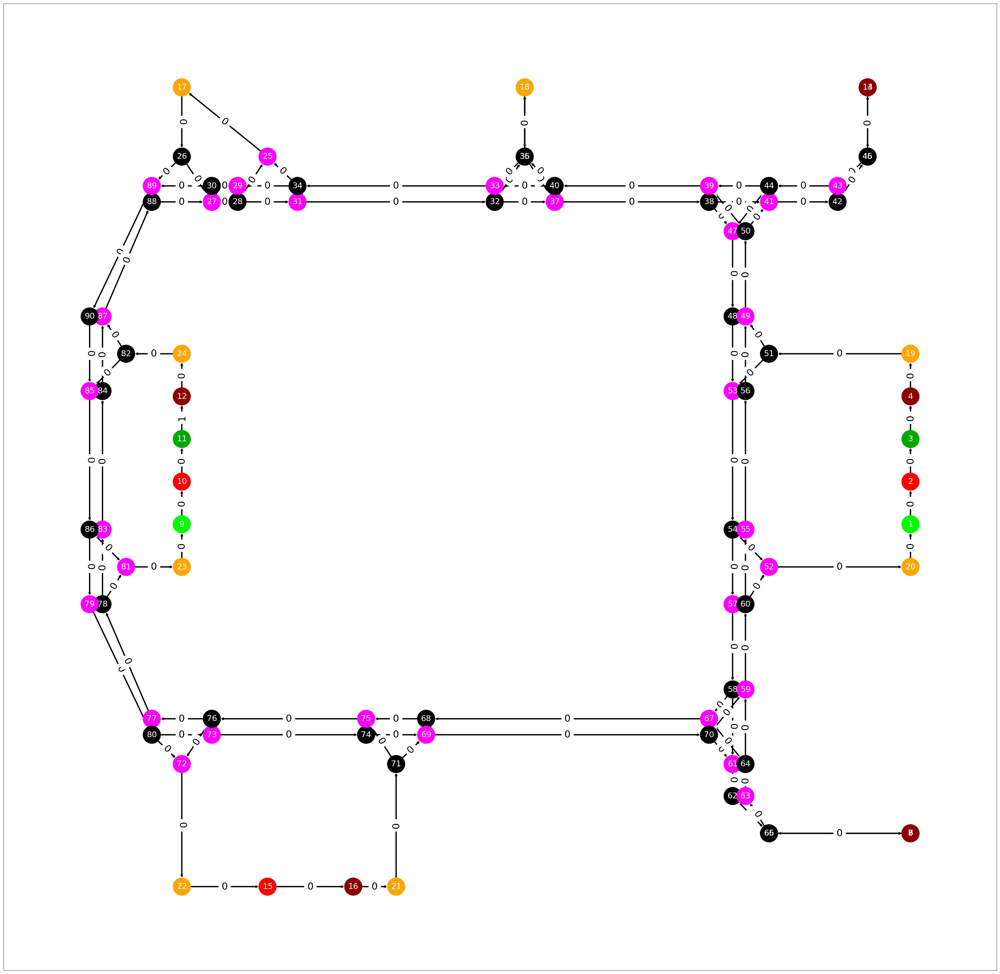


---------------------------Stan zadan---------------------------
taskId  robotId   priority            timeAdded                   behaviours

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (11, 12)        30         20      True   True  


In [48]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

In [49]:
#Przejazd przez wszystkie możliwe typy POI
robots = [
    {"id": 1, "edge": (87,88), "planningOn": True, "isFree": True, "timeRemaining": 0}
]
tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 1, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"to": 2, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 3, "parameters": {"to": 3, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},  
                       {"id": 5, "parameters": {"to": 4, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 6, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 7, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 8, "parameters": {"name": disp.Behaviour.TYPES["undock"]}},
                       {"id": 9, "parameters": {"to": 5, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 10, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 11, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 12, "parameters": {"name": disp.Behaviour.TYPES["undock"]}},
                       {"id": 13, "parameters": {"to": 6, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 14, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 15, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 16, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 17, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 18, "parameters": {"name": disp.Behaviour.TYPES["undock"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 1,
        "start_time": "2018-06-29 07:55:27.243860",
        "weight": PRIORITY['HIGH']
       }
]
robots_sim = sim.Robots(robots,10)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (11, 12)        20         20      True   True  


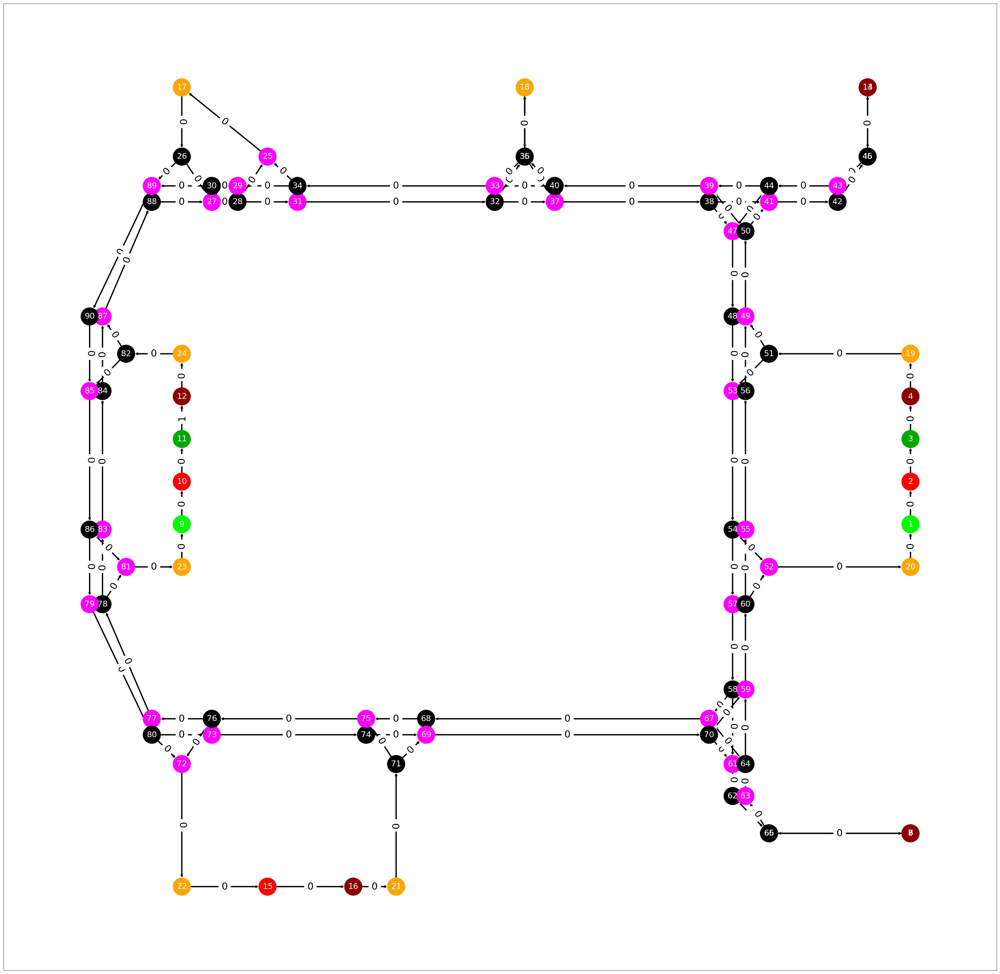


---------------------------Stan zadan---------------------------
taskId  robotId   priority            timeAdded                   behaviours

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (11, 12)        30         20      True   True  


In [126]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

In [60]:
#Przejazd przez wiele POI, wiele robotow,
robots = [
    {"id": 1, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0},#6,7,4,2
    {"id": 2, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0},#5,4,1
    {"id": 3, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0},#6,5,1
    {"id": 4, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0},#5,7,1
    {"id": 5, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0},#6,7,4,1
    {"id": 6, "edge": (25,17), "planningOn": True, "isFree": True, "timeRemaining": 0} #4,6,7,1
]
tasks = [
       {"id": 1,
        "behaviours": [{"id": 1, "parameters": {"to": 6, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 3, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 5, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 6, "parameters": {"name": disp.Behaviour.TYPES["undock"]}},
                       {"id": 7, "parameters": {"to": 4, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 8, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 9, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 10, "parameters": {"name": disp.Behaviour.TYPES["undock"]}},
                       {"id": 11, "parameters": {"to": 2, "name": disp.Behaviour.TYPES["goto"]} 
                      ],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 1,
        "start_time": "2018-06-29 07:35:27.243860",
        "weight": PRIORITY['NORMAL']
       },
       {"id": 2,
        "behaviours": [{"id": 1, "parameters": {"to": 5, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}},
                       {"id": 5, "parameters": {"to": 4, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 6, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 7, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 8, "parameters": {"name": disp.Behaviour.TYPES["undock"]}},
                       {"id": 9, "parameters": {"to": 1, "name": disp.Behaviour.TYPES["goto"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 2,
        "start_time": "2018-06-29 07:37:27.243860",
        "weight": PRIORITY['NORMAL']
       },
       {"id": 3,
        "behaviours": [{"id": 1, "parameters": {"to": 6, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"to": 5, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 5, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 6, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 7, "parameters": {"name": disp.Behaviour.TYPES["undock"]}},
                       {"id": 8, "parameters": {"to": 1, "name": disp.Behaviour.TYPES["goto"]}}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],       
        "robot": 3,
        "start_time": "2018-06-29 07:40:27.243860",
        "weight": PRIORITY['NORMAL']
       },
       {"id": 4,
        "behaviours": [{"id": 1, "parameters": {"to": 5, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}},
                       {"id": 5, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 6, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 7, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 8, "parameters": {"name": disp.Behaviour.TYPES["undock"]}},
                       {"id": 9, "parameters": {"to": 1, "name": disp.Behaviour.TYPES["goto"]}} 
                      ],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 4,
        "start_time": "2018-06-29 07:28:27.243860",
        "weight": PRIORITY['NORMAL']
       },
       {"id": 5,
        "behaviours": [{"id": 1, "parameters": {"to": 6, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]},
                       {"id": 3, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 5, "parameters": {"name": disp.Behaviour.TYPES["wait"]},
                       {"id": 6, "parameters": {"name": disp.Behaviour.TYPES["undock"]},
                       {"id": 7, "parameters": {"to": 4, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 8, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 9, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 10, "parameters": {"name": disp.Behaviour.TYPES["undock"]}},                      
                       {"id": 11, "parameters": {"to": 1, "name": disp.Behaviour.TYPES["goto"]}}
                      ],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 5,
        "start_time": "2018-06-29 07:27:27.243860",
        "weight": PRIORITY['NORMAL']
       },
       {"id": 6,
        "behaviours": [{"id": 1, "parameters": {"to": 4, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]},
                       {"id": 5, "parameters": {"to": 6, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 6, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 7, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 8, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 9, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 10, "parameters": {"name": disp.Behaviour.TYPES["undock"]},
                       {"id": 11, "parameters": {"to": 1, "name": disp.Behaviour.TYPES["goto"]}],
        "current_behaviour_index": -1,
        "status": disp.Task.STATUS_LIST["TO_DO"],
        "robot": 6,
        "start_time": "2018-06-29 07:25:27.243860",
        "weight": PRIORITY['NORMAL']
       }
]
robots_sim = sim.Robots(robots,10)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (35, 18)        120        4       True   True  
2         2      (25, 17)        10         8       True   True  
3         3      (25, 17)        130        8       True   True  
4         4      (25, 17)        230        8       True   True  
5         5      (25, 17)        170        8       True   True  
6         6      (25, 17)        150        8       True   True  


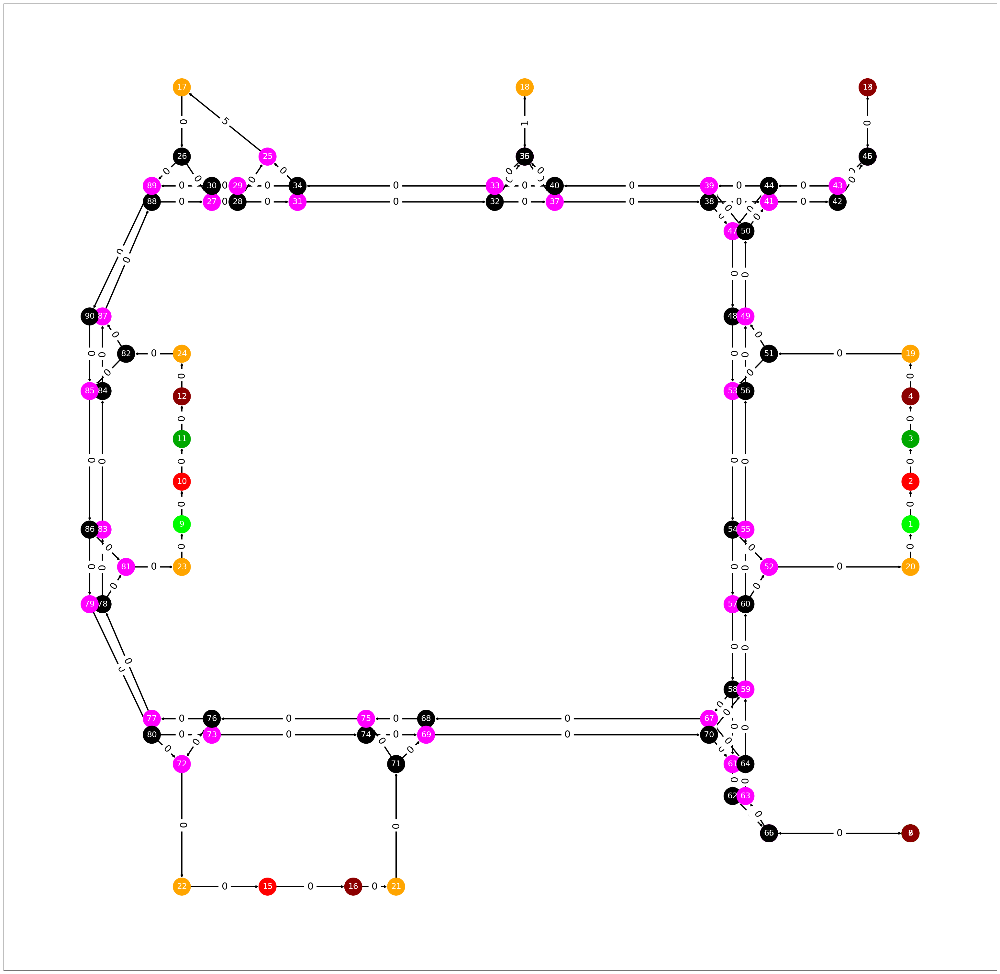

In [137]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()

In [138]:
#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()


---------------------------Stan zadan---------------------------
taskId  robotId   priority            timeAdded                   behaviours

---------------------------Nowy plan---------------------------
robotId   taskId   next edge    endBeh  taskDuration
---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         1      (35, 18)        130        4       True   True  
2         2      (25, 17)        20         8       True   True  
3         3      (25, 17)        140        8       True   True  
4         4      (25, 17)        240        8       True   True  
5         5      (25, 17)        180        8       True   True  
6         6      (25, 17)        160        8       True   True  


# Test 11
Dwa roboty dojeżdżają do tego samego POI po krawędzi. Ustalenie pierwszeństwa przejazdu dalej.

In [215]:
#Przejazd przez wiele POI, wiele robotow,
robots = [
    {"id": 1, "edge": (52,20), "planningOn": True, "isFree": True, "timeRemaining": 0},#4,1
    {"id": 2, "edge": (52,20), "planningOn": True, "isFree": True, "timeRemaining": 0} #4,1
]
tasks = [{"id": 1,
         "behaviours": [{"id": 1, "parameters": {"to": 5, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]},
                       {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]},
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]},
                       {"id": 5, "parameters": {"to": 4, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 6, "parameters": {"name": disp.Behaviour.TYPES["dock"]},
                       {"id": 7, "parameters": {"name": disp.Behaviour.TYPES["wait"]},
                       {"id": 8, "parameters": {"name": disp.Behaviour.TYPES["undock"]}},
                       {"id": 9, "parameters": {"to": 1, "name": disp.Behaviour.TYPES["goto"]}}],
        "current_behaviour_index": 4, #index tablicy nie zachowania
        "status": disp.Task.STATUS_LIST["IN_PROGRESS"],
        "robot": 1,
         "start_time": "2018-06-29 07:37:27.243860",
         "weight": PRIORITY['NORMAL']
        },
       {"id": 2,
        "behaviours": [{"id": 1, "parameters": {"to": 6, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 3, "parameters": {"to": 7, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["dock"]},
                       {"id": 5, "parameters": {"name": disp.Behaviour.TYPES["wait"]},
                       {"id": 6, "parameters": {"name": disp.Behaviour.TYPES["undock"]},
                       {"id": 7, "parameters": {"to": 4, "name": disp.Behaviour.TYPES["goto"]}}, 
                       {"id": 8, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                       {"id": 9, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                       {"id": 10, "parameters": {"name": disp.Behaviour.TYPES["undock"]}},                      
                       {"id": 11, "parameters": {"to": 1, "name": disp.Behaviour.TYPES["goto"]}
                      ],
        "current_behaviour_index": 6,#index tablicy nie zachowania
        "status": disp.Task.STATUS_LIST["IN_PROGRESS"],
        "robot": 2,
        "start_time": "2018-06-29 07:27:27.243860",
        "weight": PRIORITY['NORMAL']
       },
]
robots_sim = sim.Robots(robots,10)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         None   (52, 20)        0          0       True   False 
2         2      (20, 1)         10         4       True   True  


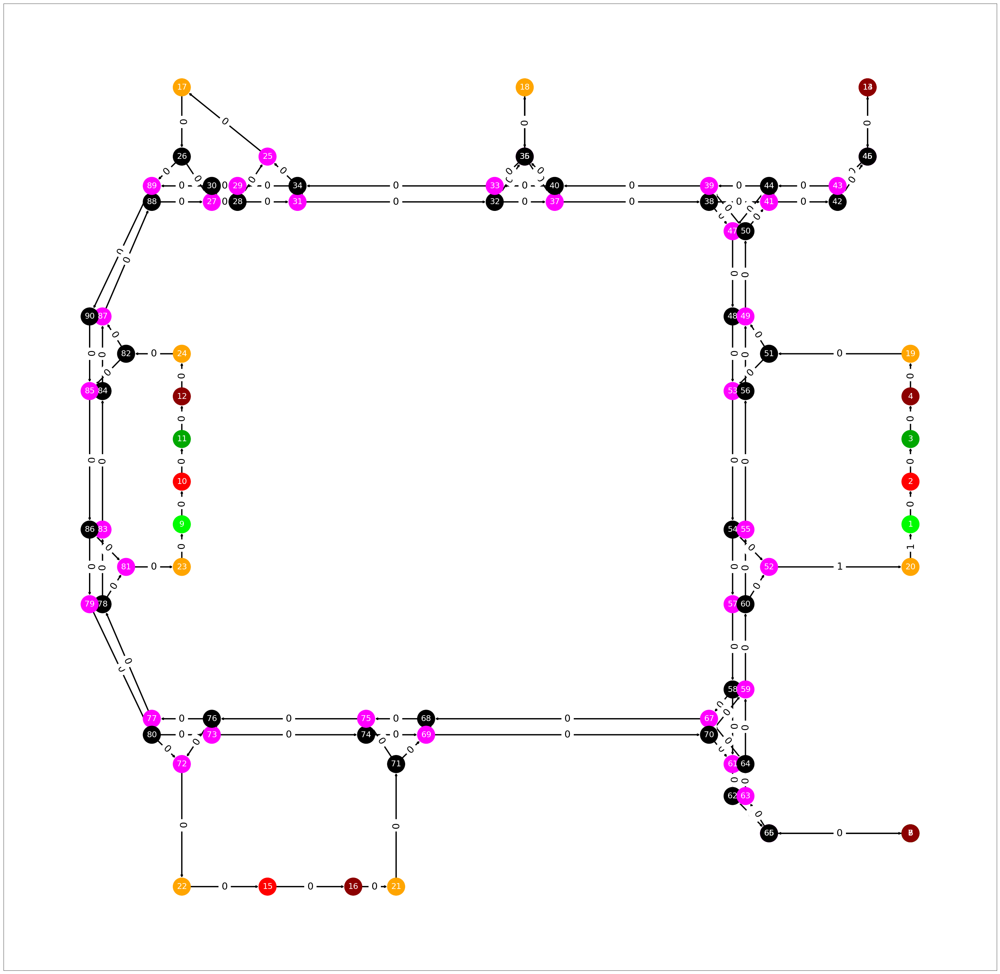


---------------------------Stan zadan---------------------------
taskId  robotId   priority            timeAdded                   behaviours
1          1          2      2018-06-29 07:37:27.243860    id name goalId status
                                                           1   1      5     3
                                                           2   2            3
                                                           3   3            3
                                                           4   4            3
                                                           5   1      4     2
                                                           6   2            1
                                                           7   3            1
                                                           8   4            1
                                                           9   1      1     1
2          2          2      2018-06-29 07:27:27.243860    id name goalId 

In [217]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
robots_state_list[0]["behTime"]=10
robots_state_list[1]["behTime"]=10
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()
#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

# Test 12 
Jazda wielu robotow w okolicach POI z wezlami typu waiting-departure

In [31]:
robots = [
    {"id": 1, "edge": (69,70), "planningOn": True, "isFree": True, "timeRemaining": 0}, #5,1
    {"id": 2, "edge": (69,70), "planningOn": True, "isFree": True, "timeRemaining": 0}, #5,1
    {"id": 3, "edge": (57,58), "planningOn": True, "isFree": True, "timeRemaining": 0}, #5,1
    {"id": 4, "edge": (57,58), "planningOn": True, "isFree": True, "timeRemaining": 0} #5,1
]
tasks = [{"id": 1,
         "behaviours": [{"id": 1, "parameters": {"to": 5, "name": disp.Behaviour.TYPES["goto"]}}, 
                        {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                        {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                        {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}},
                        {"id": 5, "parameters": {"to": 1, "name": disp.Behaviour.TYPES["goto"]}}],
          "current_behaviour_index": 0, #index tablicy nie zachowania
         "status": disp.Task.STATUS_LIST["IN_PROGRESS"],
         "robot": 1,
         "start_time": "2018-06-29 07:37:27.243860",
         "weight": PRIORITY['NORMAL']
        },
       {"id": 2,
        "behaviours": [{"id": 1,"parameters": {"to": 5, "name": disp.Behaviour.TYPES["goto"]}}, 
                        {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                        {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                        {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}},
                        {"id": 5, "parameters": {"to": 1, "name": disp.Behaviour.TYPES["goto"]}}],
        "current_behaviour_index": 0, #index tablicy nie zachowania
        "status": disp.Task.STATUS_LIST["IN_PROGRESS"],
        "robot": 2,
        "start_time": "2018-06-29 07:27:27.243860",
        "weight": PRIORITY['NORMAL']
       },
        {"id": 3,
         "behaviours": [{"id": 1, "parameters": {"to": 5, "name": disp.Behaviour.TYPES["goto"]}}, 
                        {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                        {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                        {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}},
                        {"id": 5, "parameters": {"to": 1, "name": disp.Behaviour.TYPES["goto"]}}],
         "current_behaviour_index": 0, #index tablicy nie zachowania
         "status": disp.Task.STATUS_LIST["IN_PROGRESS"],
         "robot": 3,
         "start_time": "2018-06-29 07:15:27.243860",
         "weight": PRIORITY['NORMAL']
        },
       {"id": 4,
        "behaviours": [{"id": 1, "parameters": {"to": 5, "name": disp.Behaviour.TYPES["goto"]}}, 
                        {"id": 2, "parameters": {"name": disp.Behaviour.TYPES["dock"]}},
                        {"id": 3, "parameters": {"name": disp.Behaviour.TYPES["wait"]}},
                        {"id": 4, "parameters": {"name": disp.Behaviour.TYPES["undock"]}},
                        {"id": 5, "parameters": {"to": 1, "name": disp.Behaviour.TYPES["goto"]}}],
        "current_behaviour_index": 0, #index tablicy nie zachowania
        "status": disp.Task.STATUS_LIST["IN_PROGRESS"],
        "robot": 4,
        "start_time": "2018-06-29 07:23:27.243860",
        "weight": PRIORITY['NORMAL']
       },
]
robots_sim = sim.Robots(robots,10)
supervisor_sim = sim.Supervisor(node_list, edge_list, tasks, robots_sim.get_robots_status())
#przejazd przez skrzyzowanie do POI, 3 4 2 1

---------------------------Robots---------------------------
robotId   taskId   edge     behDuration  behTime   isFree  endBeh
1         None   (69, 70)        0          0       True   False 
2         None   (69, 70)        0          0       True   False 
3         None   (57, 58)        0          0       True   False 
4         None   (57, 58)        0          0       True   False 


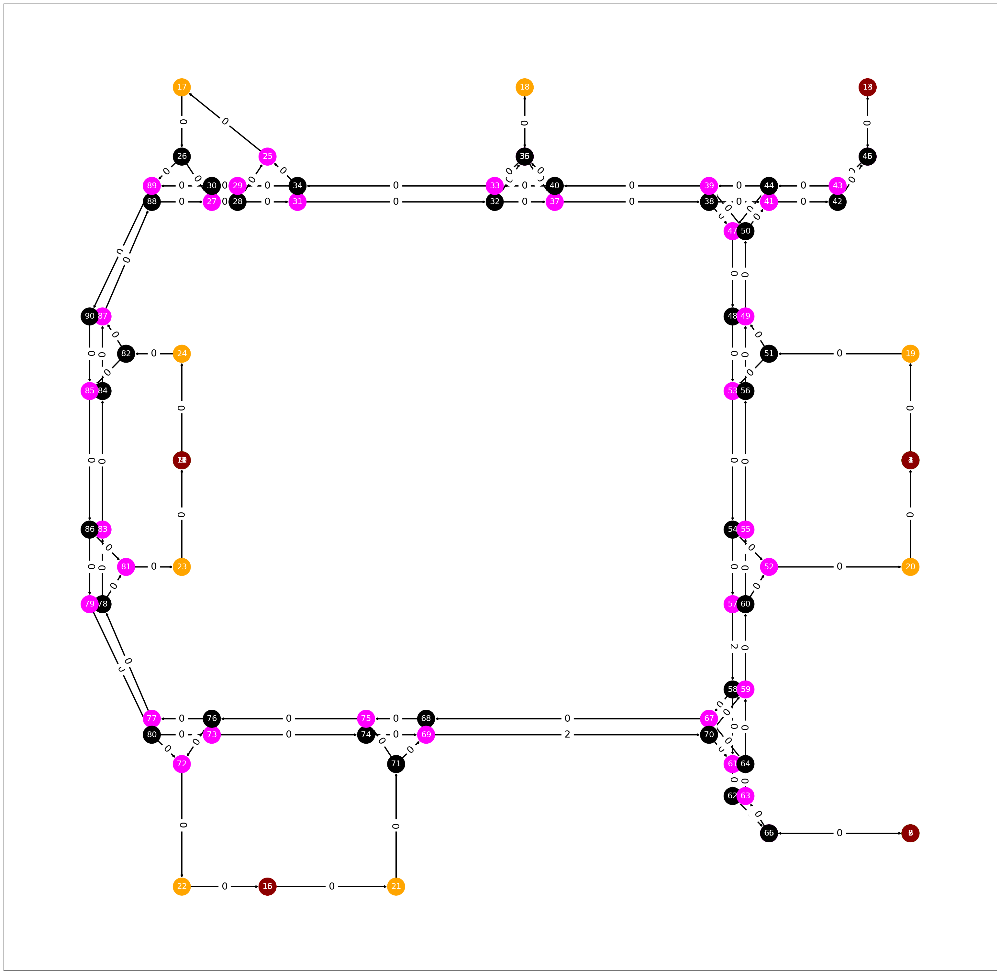


---------------------------Stan zadan---------------------------
taskId  robotId   WEIGHT              start_time          status    curr_beh_id    behaviours
1          1          3      2018-06-29 07:37:27.243860    IN_PROGRESS    1         id name goalId 
                                                                                    1   1      5
                                                                                    2   2
                                                                                    3   3
                                                                                    4   4
                                                                                    5   1      1
2          2          3      2018-06-29 07:27:27.243860    IN_PROGRESS    1         id name goalId 
                                                                                    1   1      5
                                                                               

In [32]:
robots_state_list = robots_sim.get_robots_status() #aktualny stan robotow po inicjalizacji
robots_sim.print_robot_status() #aktualny stan robotow w supervisorze
supervisor_sim.run(robots_state_list) 
supervisor_sim.print_graph(plot_size=(55,55))

robots_sim.set_tasks(supervisor_sim.get_robots_command()) 
robots_sim.run()
#wyswietlenie planu dla robotow oraz przyszlego stanu robotow
supervisor_sim.print_data()
robots_sim.print_robot_status()

In [ ]:
tasks = [{"id": 1,
          "robot": 1,
          "start_time": "2018-06-29 07:37:27.243860", 
          "behaviours": [{"id": 1, "goalId": 5, "name": Task.beh_type["goto"]}, 
                        {"id": 2, "name": Task.beh_type["dock"]},
                        {"id": 3, "name": Task.beh_type["wait"]},
                        {"id": 4, "name": Task.beh_type["undock"]},
                        {"id": 5,  "parameters": {"name": Task.beh_type["goto"], "to": "id_poi"}],
         "current_behaviour_index": string_id,
         "status": Task.status["not_started"], # 'To Do' - do przydzielenia, nierozpoczete
                         #ASSIGN, COMPLETED, IN_PROGRESS
         "weight": Task.priority['normal']      #zamiast priorytetu          
        },
                         
                         
                         
       {"id": 2,
        "behaviours": [{"id": 1, "status": Task.status["in_progress"], "goalId": 5, "name": Task.beh_type["goto"]}, 
                        {"id": 2, "status": Task.status["not_started"], "name": Task.beh_type["dock"]},
                        {"id": 3, "status": Task.status["not_started"], "name": Task.beh_type["wait"]},
                        {"id": 4, "status": Task.status["not_started"], "name": Task.beh_type["undock"]},
                        {"id": 5, "status": Task.status["not_started"], "goalId": 1, "name": Task.beh_type["goto"]}],
        "robotId": 2,
        "timeAdded": "2018-06-29 07:27:27.243860",
        "weight": Task.priority['normal']
       },
        {"id": 3,
         "behaviours": [{"id": 1, "status": Task.status["in_progress"], "goalId": 5, "name": Task.beh_type["goto"]}, 
                        {"id": 2, "status": Task.status["not_started"], "name": Task.beh_type["dock"]},
                        {"id": 3, "status": Task.status["not_started"], "name": Task.beh_type["wait"]},
                        {"id": 4, "status": Task.status["not_started"], "name": Task.beh_type["undock"]},
                        {"id": 5, "status": Task.status["not_started"], "goalId": 1, "name": Task.beh_type["goto"]}],
         "robotId": 3,
         "timeAdded": "2018-06-29 07:15:27.243860",
         "weight": Task.priority['normal']
        },
       {"id": 4,
        "behaviours": [{"id": 1, "status": Task.status["in_progress"], "goalId": 5, "name": Task.beh_type["goto"]}, 
                        {"id": 2, "status": Task.status["not_started"], "name": Task.beh_type["dock"]},
                        {"id": 3, "status": Task.status["not_started"], "name": Task.beh_type["wait"]},
                        {"id": 4, "status": Task.status["not_started"], "name": Task.beh_type["undock"]},
                        {"id": 5, "status": Task.status["not_started"], "goalId": 1, "name": Task.beh_type["goto"]}],
        "robotId": 4,
        "timeAdded": "2018-06-29 07:23:27.243860",
        "weight": Task.priority['normal']
       },
]
          

          "30.10.2020, 17:37:53"